### Step 0: Get packages and helper functions

In [1]:
import numpy as np; import torch; import time

from misc_helper import combine_layers, get_dt, get_userPar, training_loop, make_gif
from plot_helper import reference_plot, sample_plot
from trainingData_helper import generate_trainData
from pde_helper import PDE_class
from neuralNetwork_helper import Net, activation_func_a, weight_class, dtPINN

## Step 1: Define PDE problem and visualize 

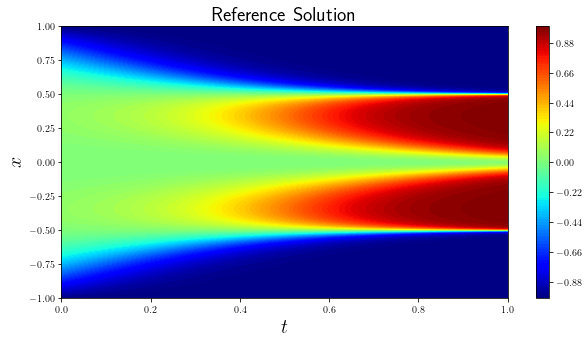

In [2]:
pde_type = 'allen-cahn'
newParams = {}

#pde_type = 'new'
#newParams = {}; newParams['data'] = path+'\\data\\convec_10.mat'; newParams['pde'] = 'u_t + 10*u_x'; newParams['IC'] = 'np.sin(x)';

PDE = PDE_class(pde_type, newParams)
dataPar = PDE.data()

# Reference solution
reference_plot(dataPar)

## Step 2: dtPINN user settings

In [8]:
### Neural network parameters
input_encoding = 1 # Boolean for encode input to enforce exact boundary condtions
M = 1; L = get_dt(dataPar['xmin'], dataPar['xmax'], 1) # Hyperparameters for exact BC encoding, not used if turned off
hidden_layers = [50, 50, 50, 50]; layers = combine_layers(input_encoding, M, hidden_layers) # PINN layers
# Note Adam and L-BFGS epoch/iterations are per frame for generating animations, the total amount is multiplied by the training loops defined below
# Will be cutoff early if a new network is added since optimizer needs to be reset via this control loop
adam_params = [500, 0.001] # Optimization Hyperparameters for Adam [epochs, learning rate]
lbfgs_params = [0.1, 500, None, -1, -1, 50] # Optimization Hyperparameters for LBFGS [learning rate, max iterations, max evaluations, tolerance gradient, tolerance change, history size]
adaptive_activation = 0 # Adaptive activation functions in NN
learned_weights = 0 

### Training data parameters
N_x = 100; N_t = 100; N_f = N_x*N_t # Number of collocation points in the ENTIRE domian (pre subdomain partitioning)
N_0 = 200 # Number of initial condtion points in the ENTIRE domain
N_b = 400 # Number of boundary condtion points in the ENTIRE domain
N_i = N_0 # Number of interface continuity points for each interface (total = N_i*(n-1))
collocation_sampling = 'lhs' # Latin-hypercube or grid sampling

### From Algorithm 1 in paper
## 1. Choose stacked-decomposition parameters [n, dS, adaptive dt]
num_partitions = 1; dt = get_dt(dataPar['tmin'], dataPar['tmax'], num_partitions) # Number of time-slabs in domain (1 = PINN) and dt derived from number and t-domain; 
dS = 1 # 
causal_dS = 1 #
stacked_tol = 1*10**(-12)
#adaptive_dt = 0 # Boolean [0 = off, 1 = on]

## 2. Choose interface conditions [residual continuity, Cp continuity, other]
interface_condition = ['u'] # List of interface condtions to add (u = solution continuity, uavg = average solution continuity, residual = minimize residuals, rc = minimize residual continuity)
# [xPINN = 'uavg' + 'rc', C^p continuity = 'u' for first-order systems]

## 3. Choose transfer learning parameters [number of layers, trainability of layers]
# If all layers that are transfered and kept learnable = 'fine-tuning'
# If some layers that are transfered and made unlearnable = 'transfer learning'
layer_transfer = [1, 1, 1, 1, 1] # Boolean mask to transfer weights and bias (length = len(layers) - 1)
layer_trainability = [1, 1, 1, 1, 1] # Boolean mask to make layers continue to be learnable or not (length = len(layers) - 1)

## 4. Choose window-sweeping parameters [weighting scheme, scheme hyperparameters]
#window_scheme = 'erf'
#scheme_parameters = (50, 10**(-8), 10**(-2), 1, 10**(-5)) 
window_scheme = 'uniform'
scheme_parameters = [1*10**(-1), 10**(-9), 1*10**(-1), 1]
# [(If 'none': , If 'uniform' or 'linear': width, propogate loss tolerance, dt, scale; If 'erf': sharpness, propogate loss tolerance, dt, scale, set cutoff tolerance; If 'causual_weights': epsilon), bound tolerance]

userPar = get_userPar(pde_type, input_encoding, M, L, layers, adam_params, lbfgs_params, adaptive_activation, learned_weights, N_x, N_t, N_f, N_0, N_b, N_i, collocation_sampling,\
                     num_partitions, dt, dS, causal_dS, interface_condition, layer_transfer, layer_trainability, window_scheme, scheme_parameters, PDE, stacked_tol)

### Step 2.1: Generate and visualize training data

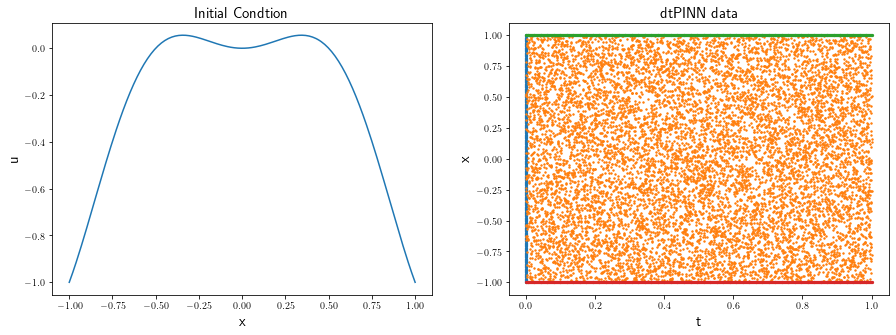

In [9]:
dataPar = generate_trainData(dataPar, userPar)
sample_plot(dataPar, userPar)

## Step 3: Train model and visualize

### Step 3.1: Define training and visualization parameters

In [10]:
### Training visualization parameters
userPar['save_fig'] = 0; # Save training figures
userPar['model_name'] = 'convection_test' # Name of file to save training snapshots under
userPar['show_fig'] = 1; # Display training figures
userPar['verbose'] = 1 # Print out various training varibles at train time such as loss and iterations
SEED = 0

### Step 3.2: Initalize the model

In [11]:
print('SEED:', SEED); torch.manual_seed(SEED); np.random.seed(SEED);
model = dtPINN(dataPar, userPar)

SEED: 0


### Step 3.3: Train the model

dtPINN
Train Adam:
epoch 100, loss: 0.546292
epoch 200, loss: 0.302062
epoch 300, loss: 0.239002
epoch 400, loss: 0.18782
epoch 500, loss: 0.145336
Training time: 10.6553


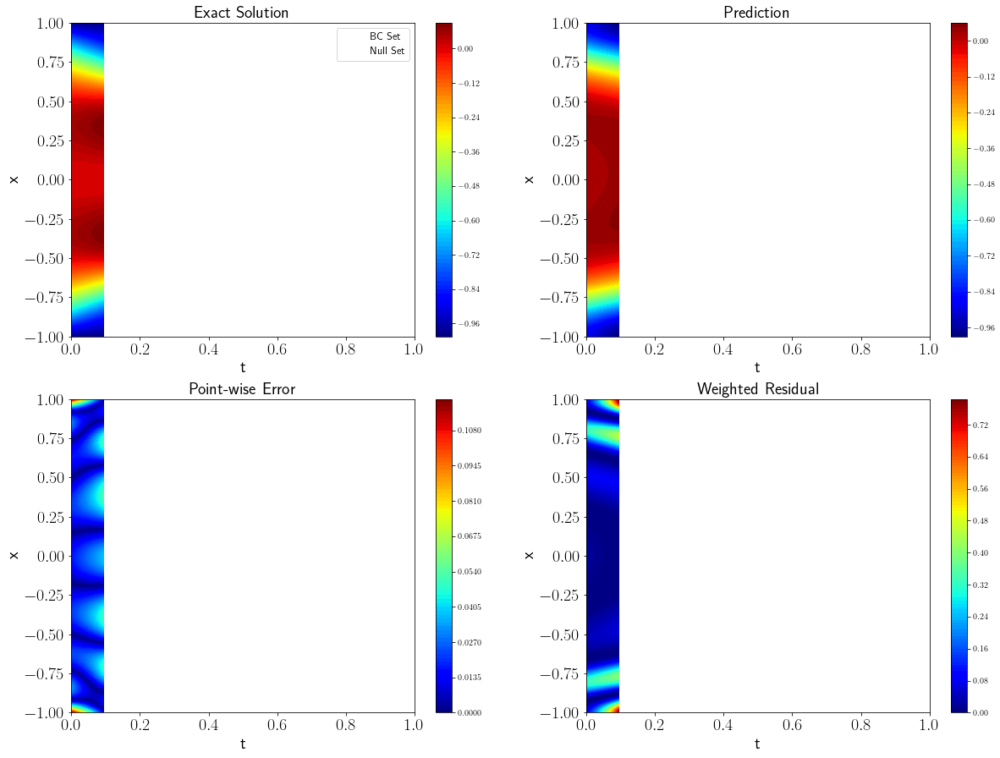

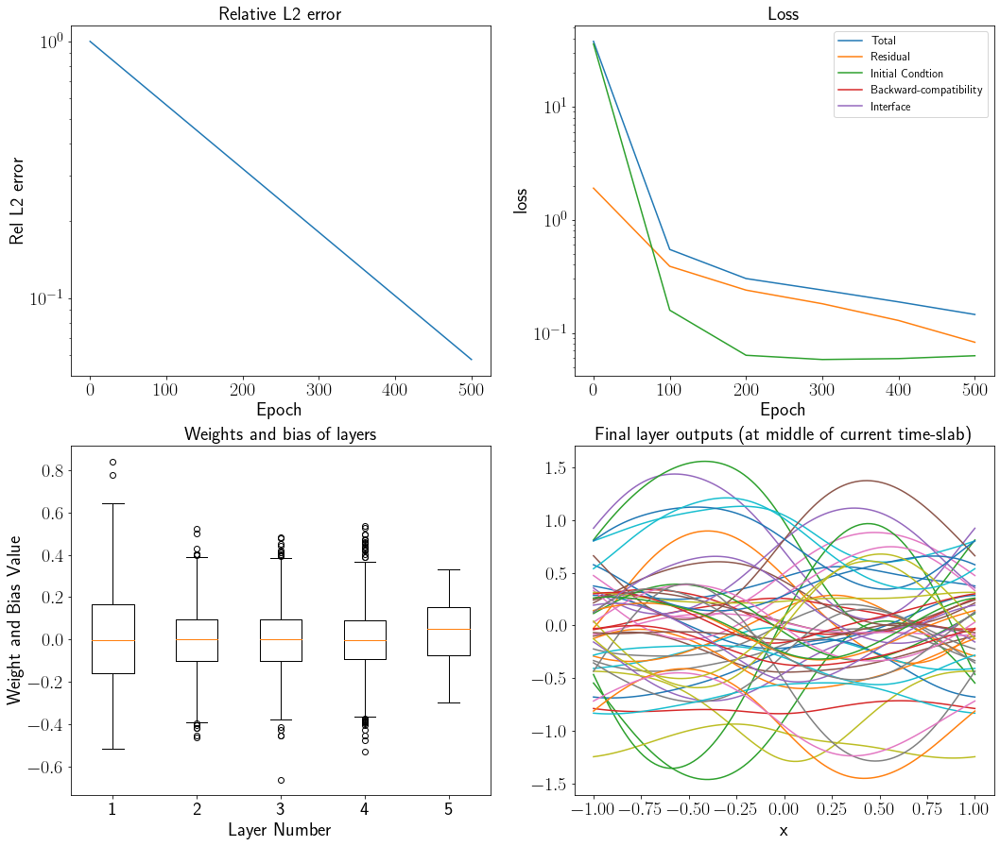

L2-error:  0.05767239155768181
Train L-BFGS:
epoch 100, loss: 0.0333649, delta loss: 0.000242077
epoch 200, loss: 0.00815866, delta loss: 7.26143e-05
epoch 300, loss: 0.00441231, delta loss: 1.20532e-05
epoch 400, loss: 0.0029556, delta loss: 6.36373e-06
epoch 500, loss: 0.00227942, delta loss: 7.04336e-06
Training time: 24.2735


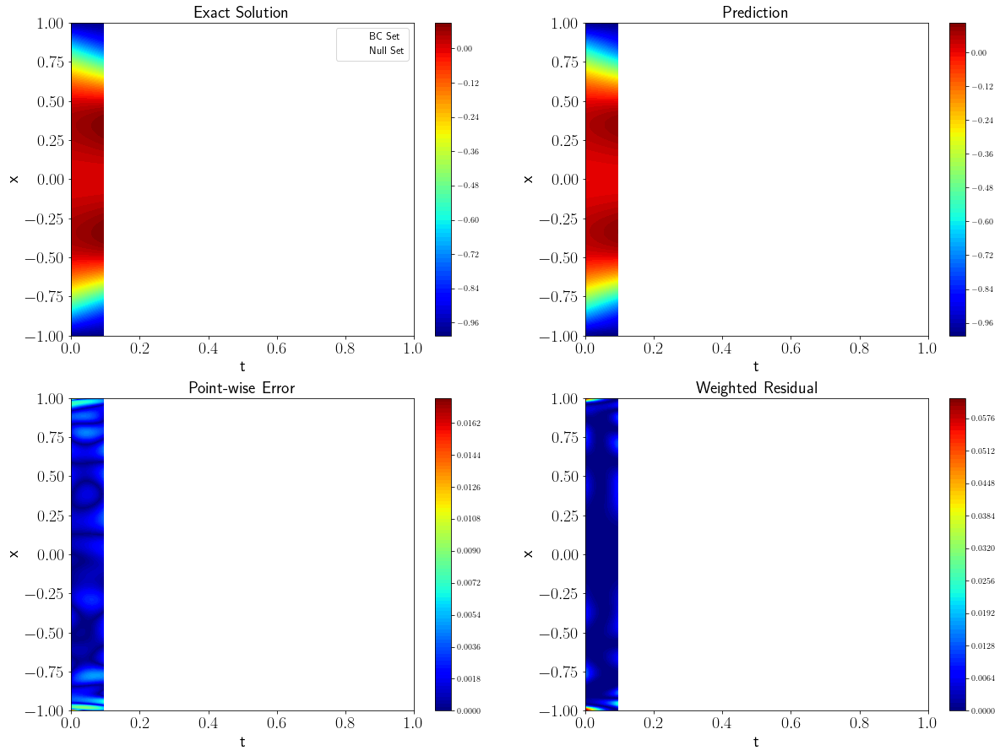

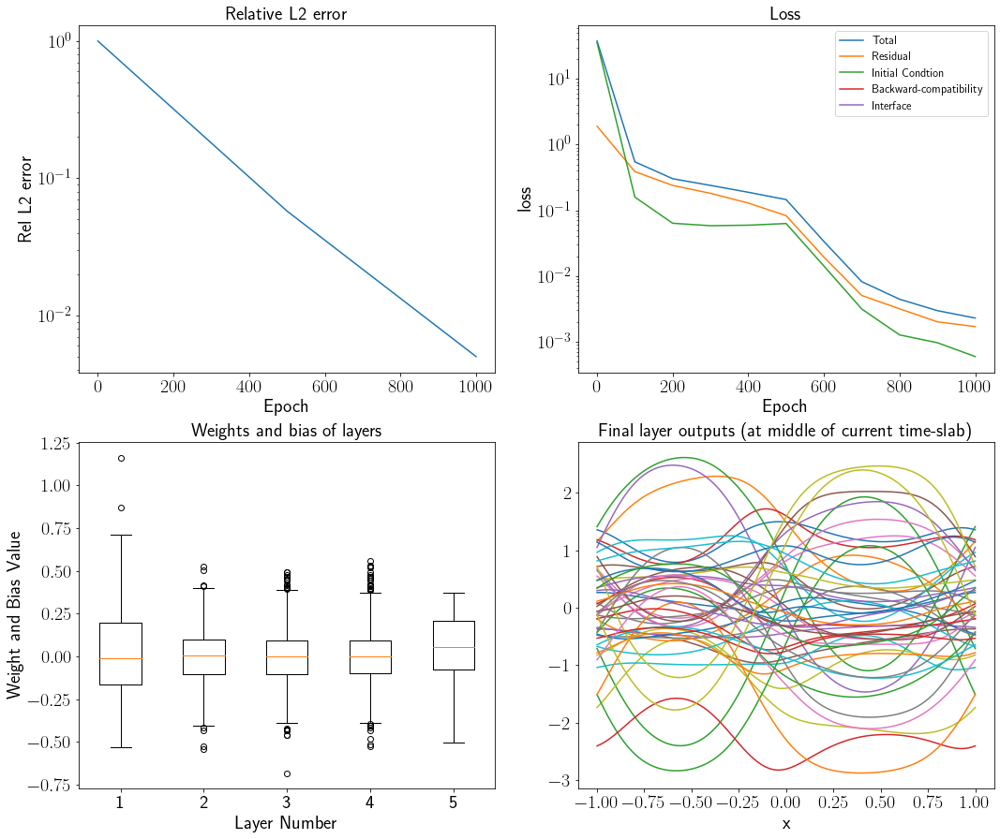

L2-error:  0.005013826526193373
Train L-BFGS:
epoch 100, loss: 0.00198981, delta loss: 4.37116e-06
epoch 200, loss: 0.00160328, delta loss: 5.34812e-06
epoch 300, loss: 0.0011367, delta loss: 3.3431e-06
epoch 400, loss: 0.00470464, delta loss: 2.98871e-05
epoch 500, loss: 0.00288036, delta loss: 2.61848e-05
Training time: 37.5905


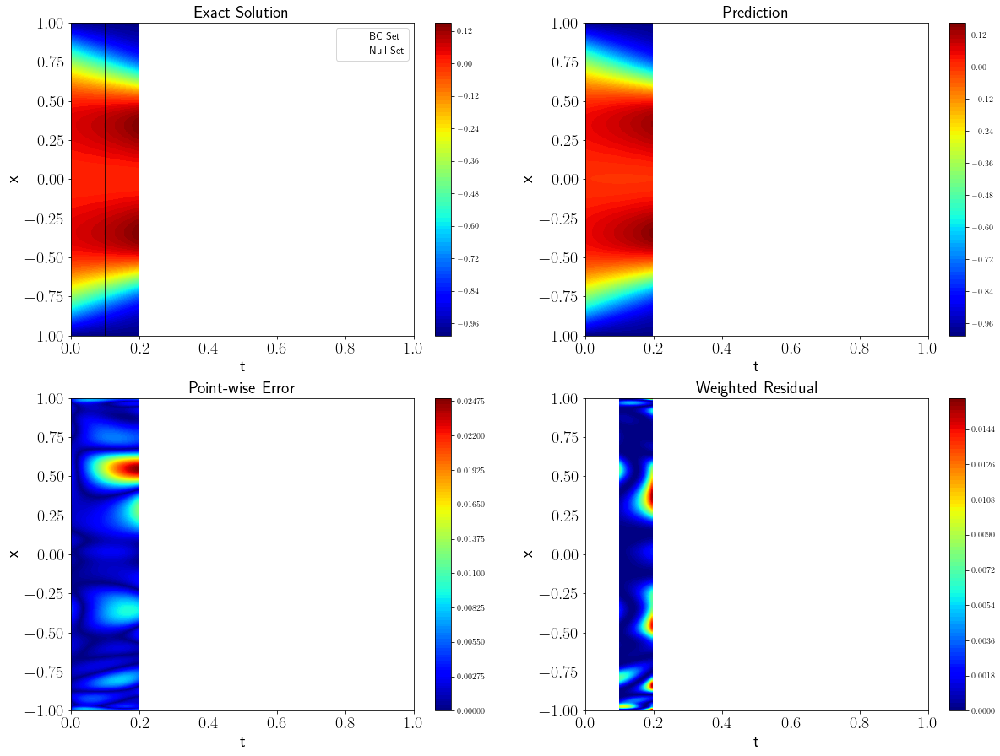

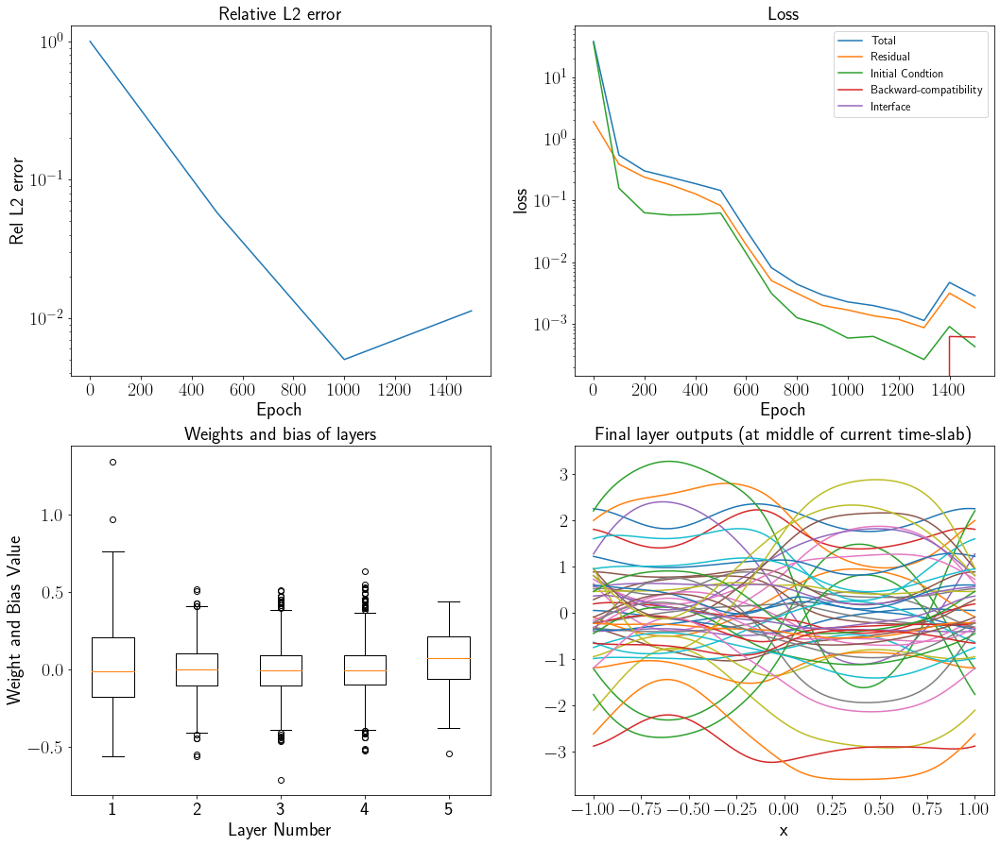

L2-error:  0.011276008950814879
Train L-BFGS:
epoch 100, loss: 0.00157421, delta loss: 2.45578e-06
epoch 200, loss: 0.00118421, delta loss: 4.09142e-06
epoch 300, loss: 0.000943342, delta loss: 2.7502e-06
epoch 400, loss: 0.000815596, delta loss: 1.6063e-06
epoch 500, loss: 0.000663225, delta loss: 7.19971e-07
Training time: 51.6089


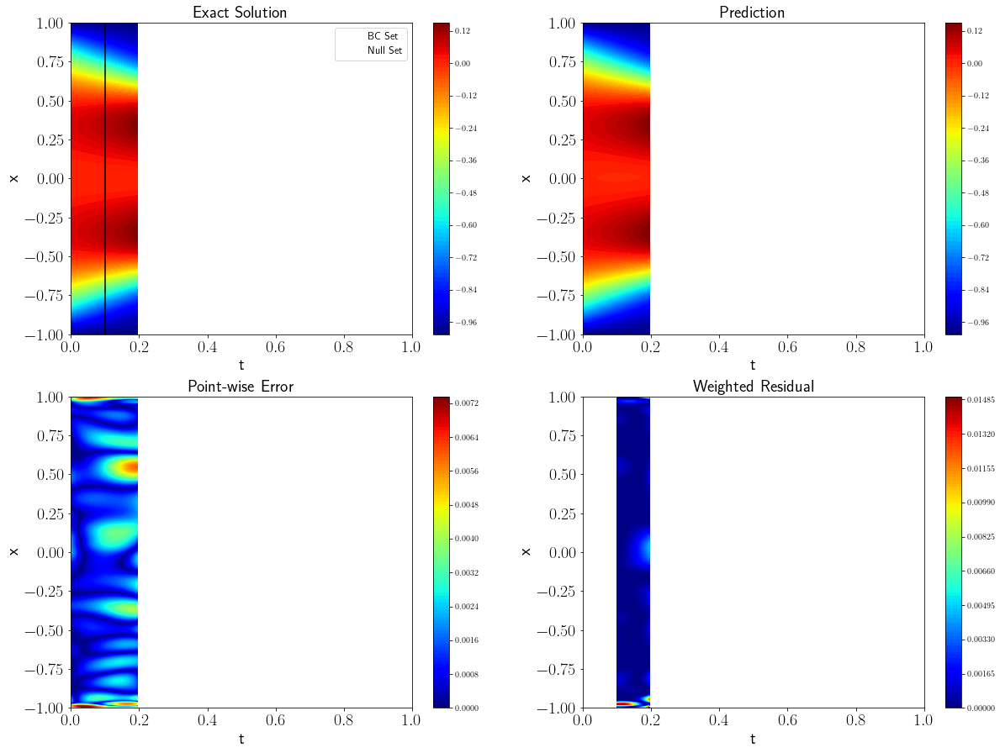

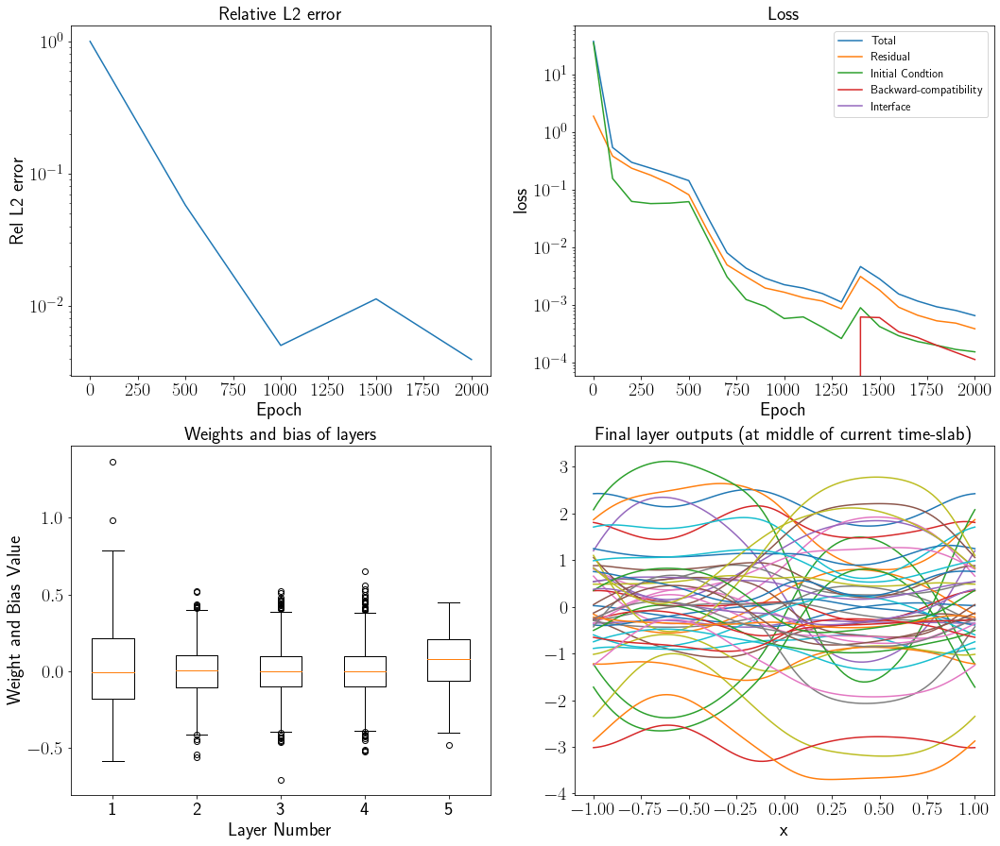

L2-error:  0.003922681826246668
Train L-BFGS:
epoch 100, loss: 0.000604366, delta loss: 1.00944e-06
epoch 200, loss: 0.000524056, delta loss: 4.61878e-07
epoch 300, loss: 0.000483846, delta loss: 3.5853e-07
epoch 400, loss: 0.000445377, delta loss: 2.0006e-07
epoch 500, loss: 0.00196864, delta loss: 1.00539e-05
Training time: 65.5201


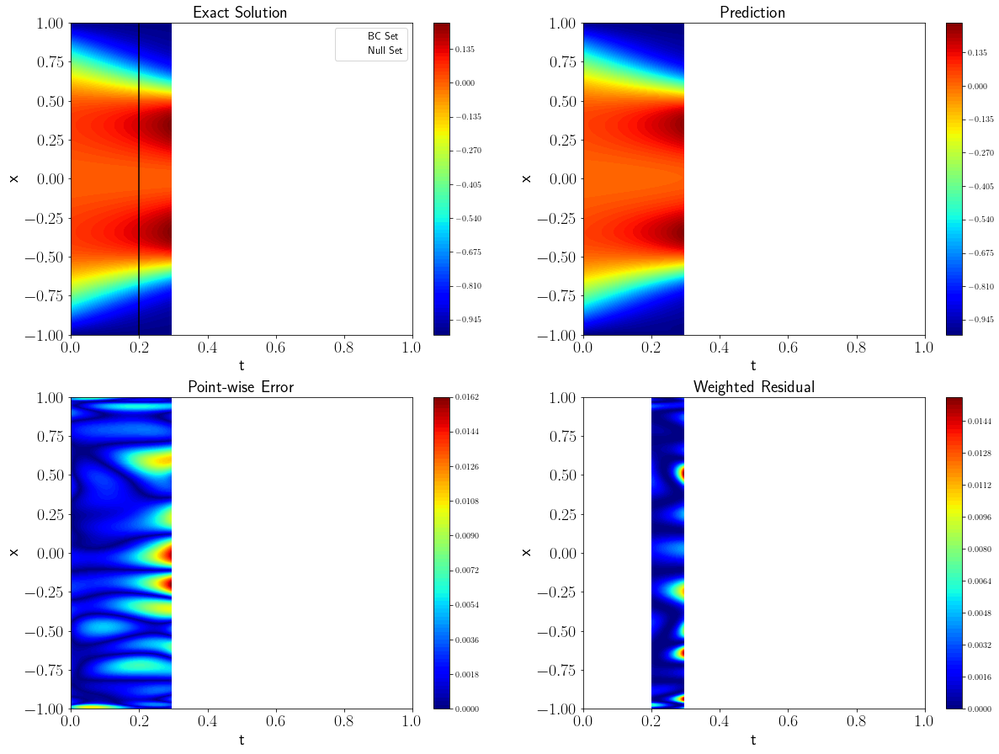

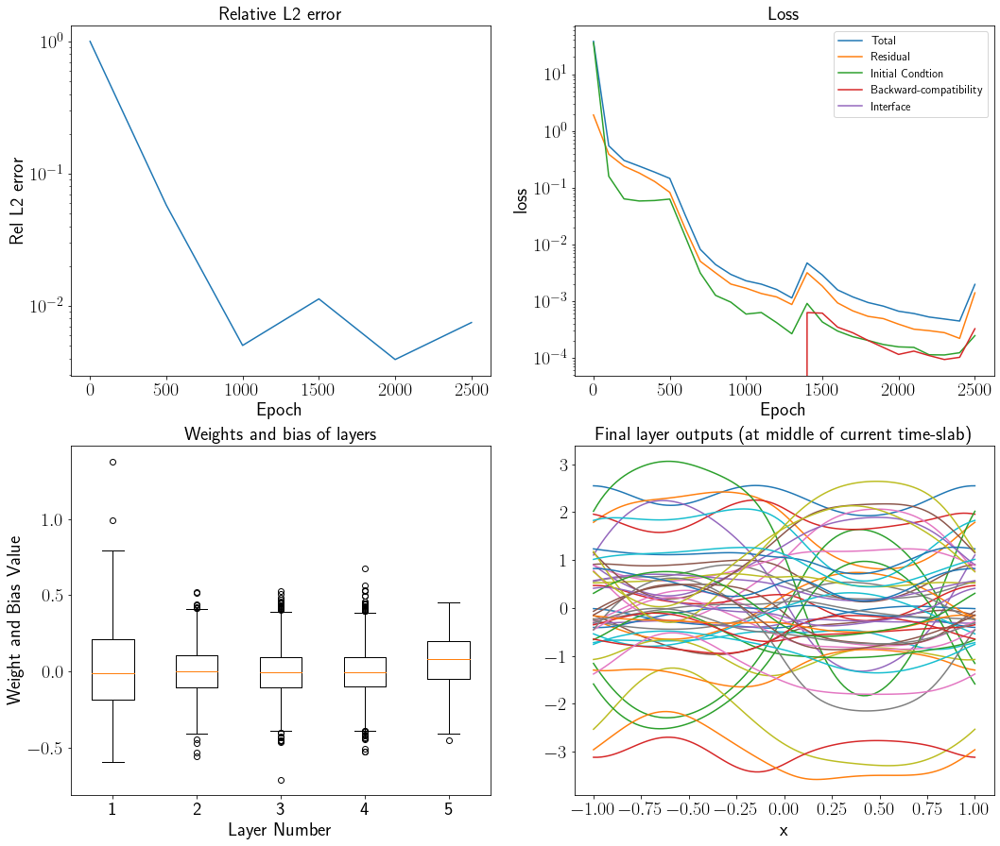

L2-error:  0.007468276855581045
Train L-BFGS:
epoch 100, loss: 0.00147997, delta loss: 1.3836e-06
epoch 200, loss: 0.00125879, delta loss: 2.76696e-06
epoch 300, loss: 0.00109663, delta loss: 1.23575e-06
epoch 400, loss: 0.000994738, delta loss: 1.83913e-06
epoch 500, loss: 0.000885167, delta loss: 9.79519e-07
Training time: 79.7973


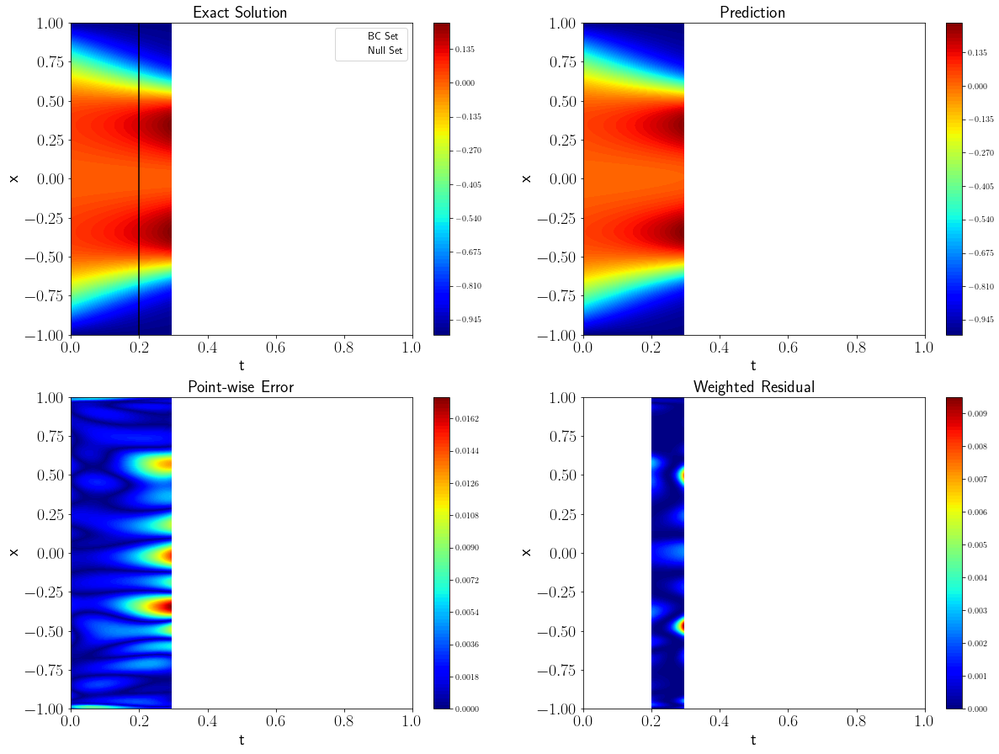

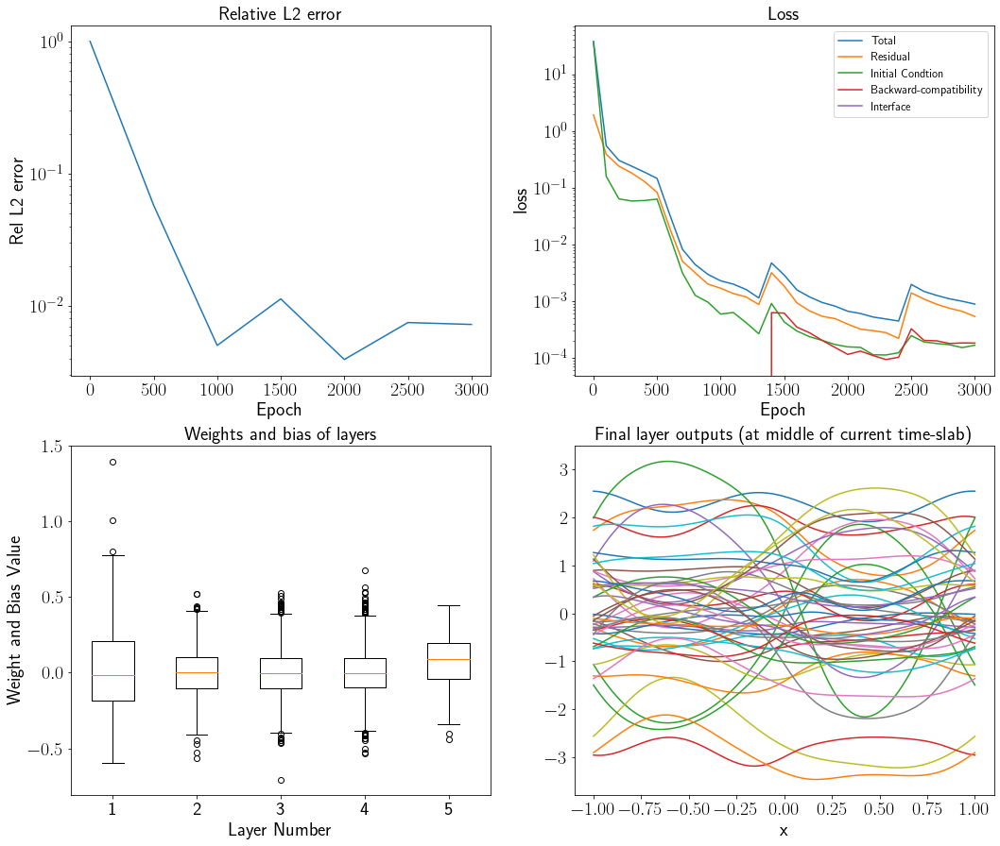

L2-error:  0.007225876456718328
Train L-BFGS:
epoch 100, loss: 0.000716327, delta loss: 9.10135e-07
epoch 200, loss: 0.000660019, delta loss: 9.35746e-07
epoch 300, loss: 0.000596925, delta loss: 4.20434e-07
epoch 400, loss: 0.000539927, delta loss: 9.5088e-07
epoch 500, loss: 0.000481631, delta loss: 4.82425e-07
Training time: 93.1452


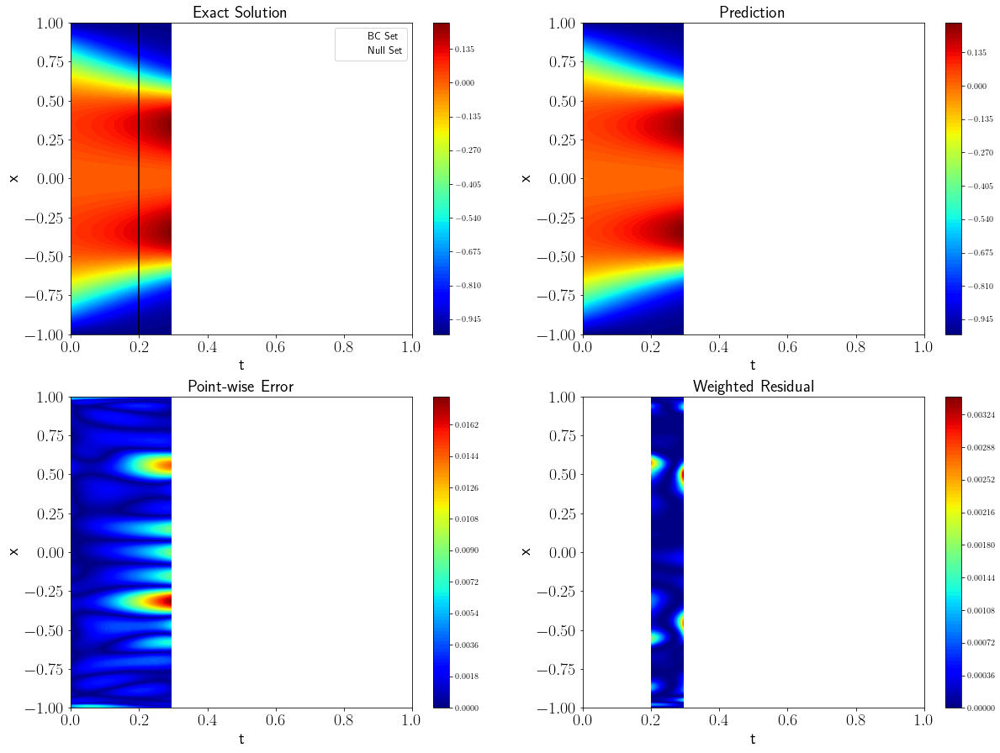

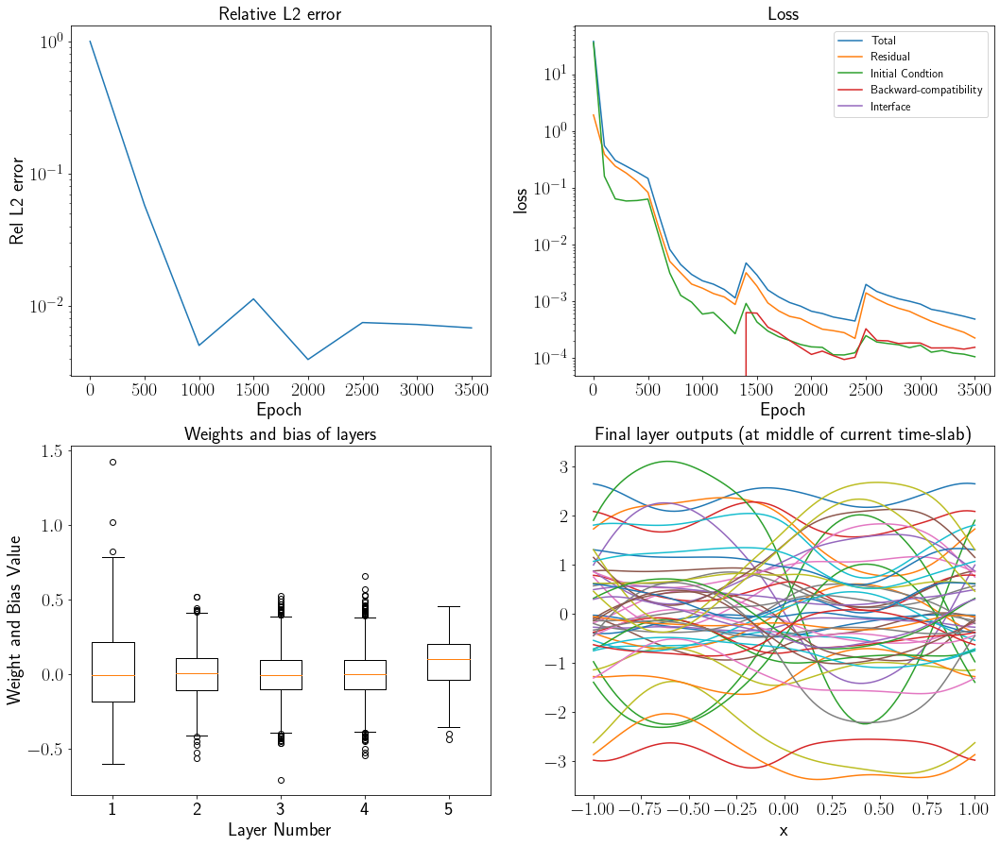

L2-error:  0.006804295856820679
Train L-BFGS:
epoch 100, loss: 0.00041647, delta loss: 3.69299e-07
epoch 200, loss: 0.00177076, delta loss: 1.68891e-05
epoch 300, loss: 0.00111825, delta loss: 2.38151e-06
epoch 400, loss: 0.000774707, delta loss: 1.78453e-06
epoch 500, loss: 0.000553299, delta loss: 1.04727e-06
Training time: 107.4739


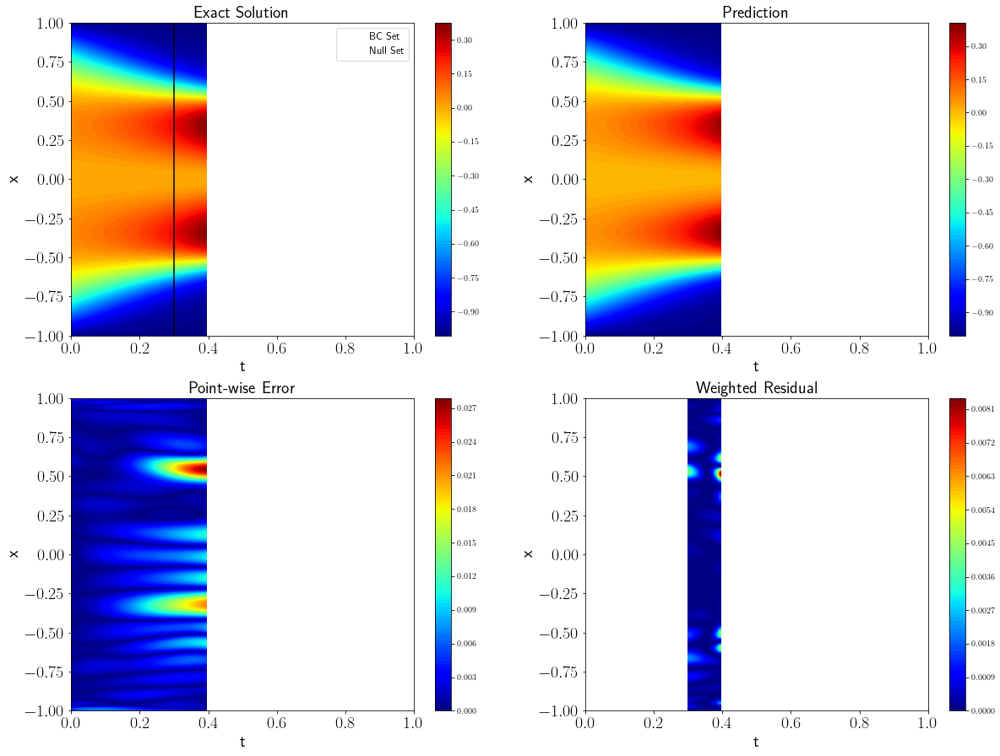

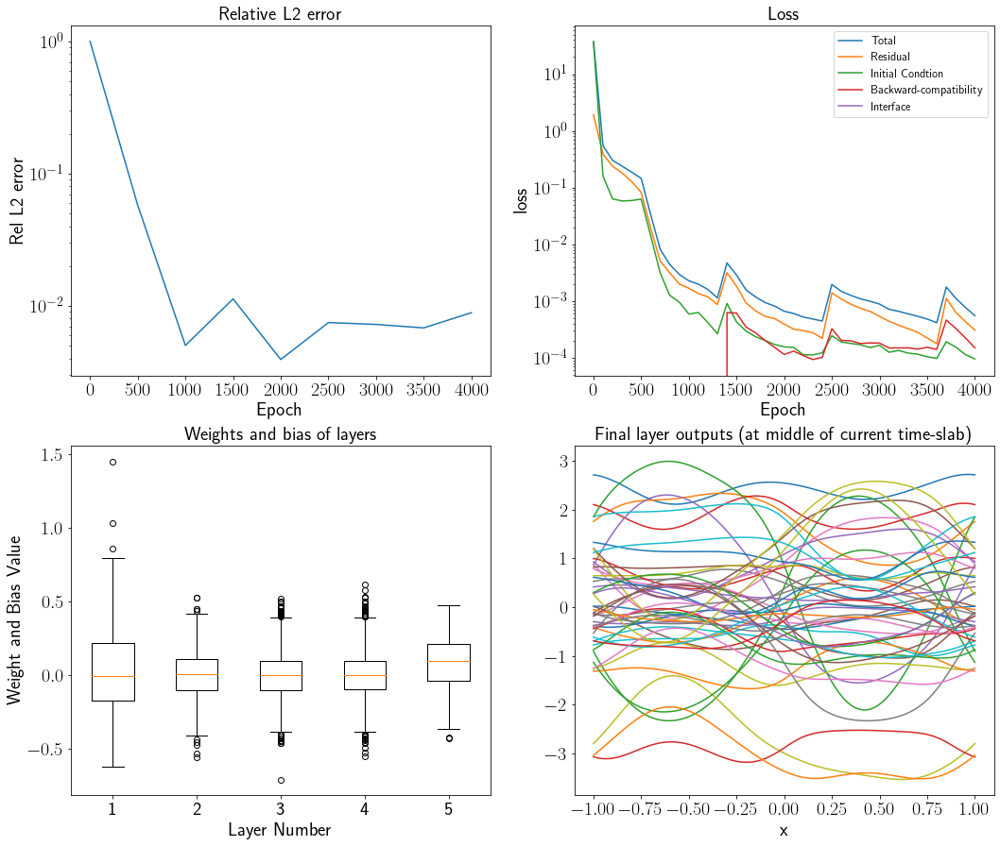

L2-error:  0.00886869468898337
Train L-BFGS:
epoch 100, loss: 0.000493082, delta loss: 4.28408e-07
epoch 200, loss: 0.000451376, delta loss: 2.98169e-07
epoch 300, loss: 0.000404082, delta loss: 3.4555e-07
epoch 400, loss: 0.00651613, delta loss: 0.00023353
epoch 500, loss: 0.00259356, delta loss: 1.76257e-05
Training time: 121.2795


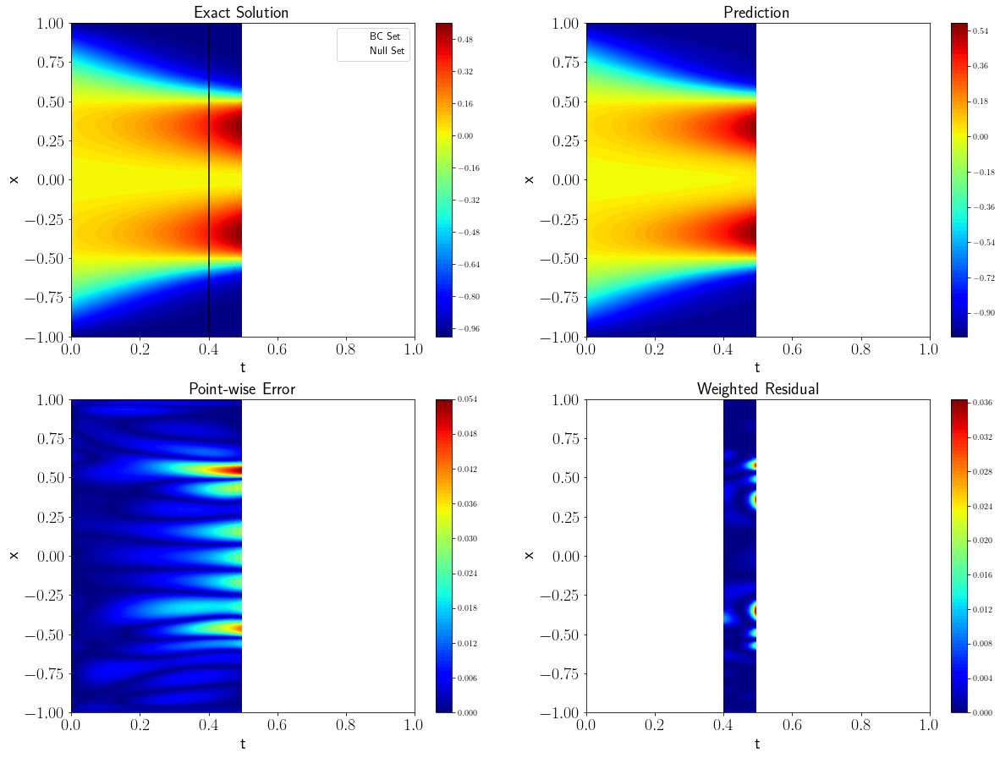

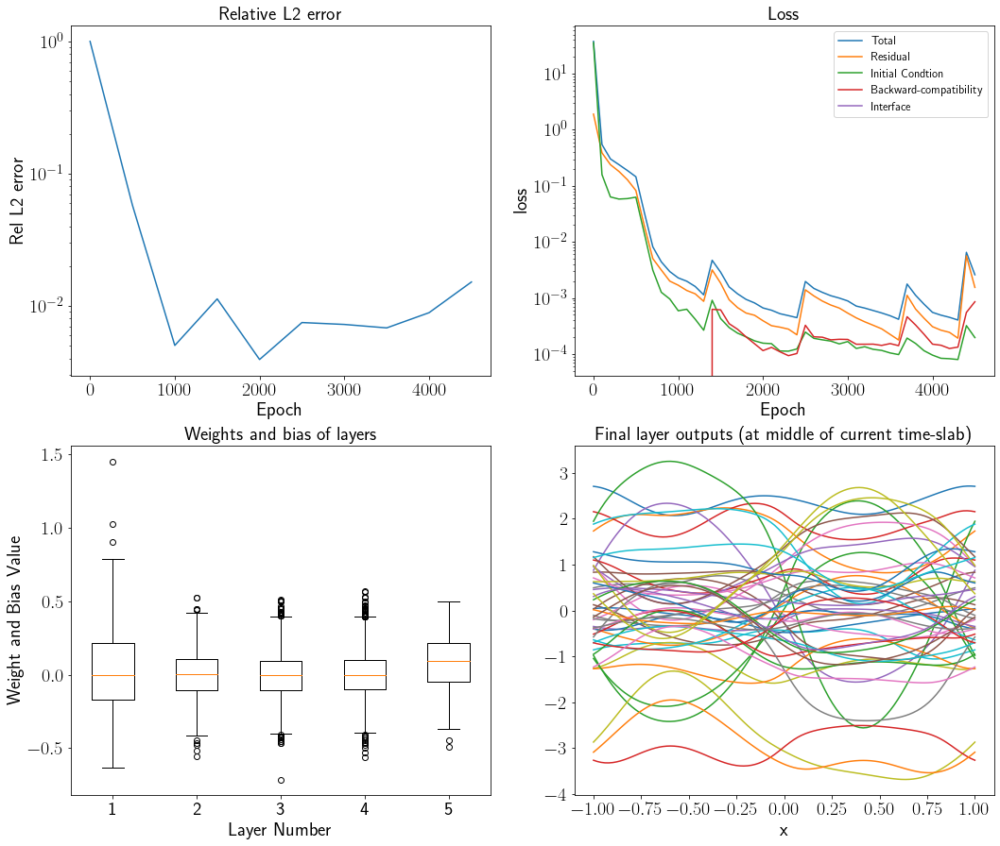

L2-error:  0.015137882906899523
Train L-BFGS:
epoch 100, loss: 0.0018871, delta loss: 5.68968e-06
epoch 200, loss: 0.00146412, delta loss: 1.82842e-06
epoch 300, loss: 0.00126908, delta loss: 2.12877e-06
epoch 400, loss: 0.00111033, delta loss: 1.49908e-06
epoch 500, loss: 0.00100746, delta loss: 4.23286e-07
Training time: 135.4600


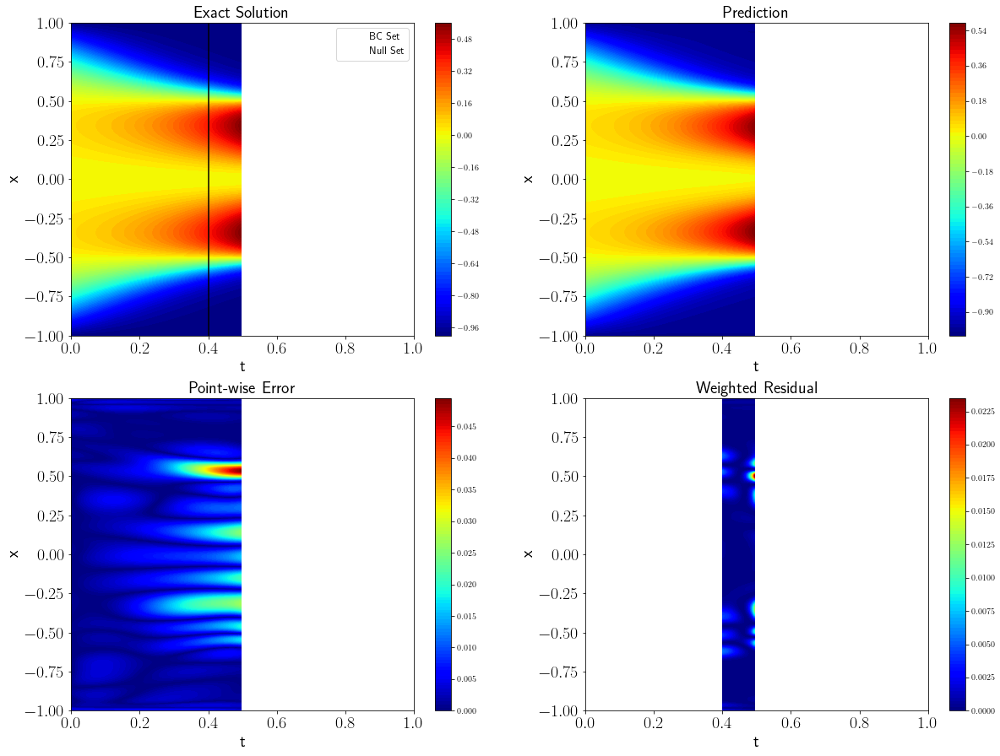

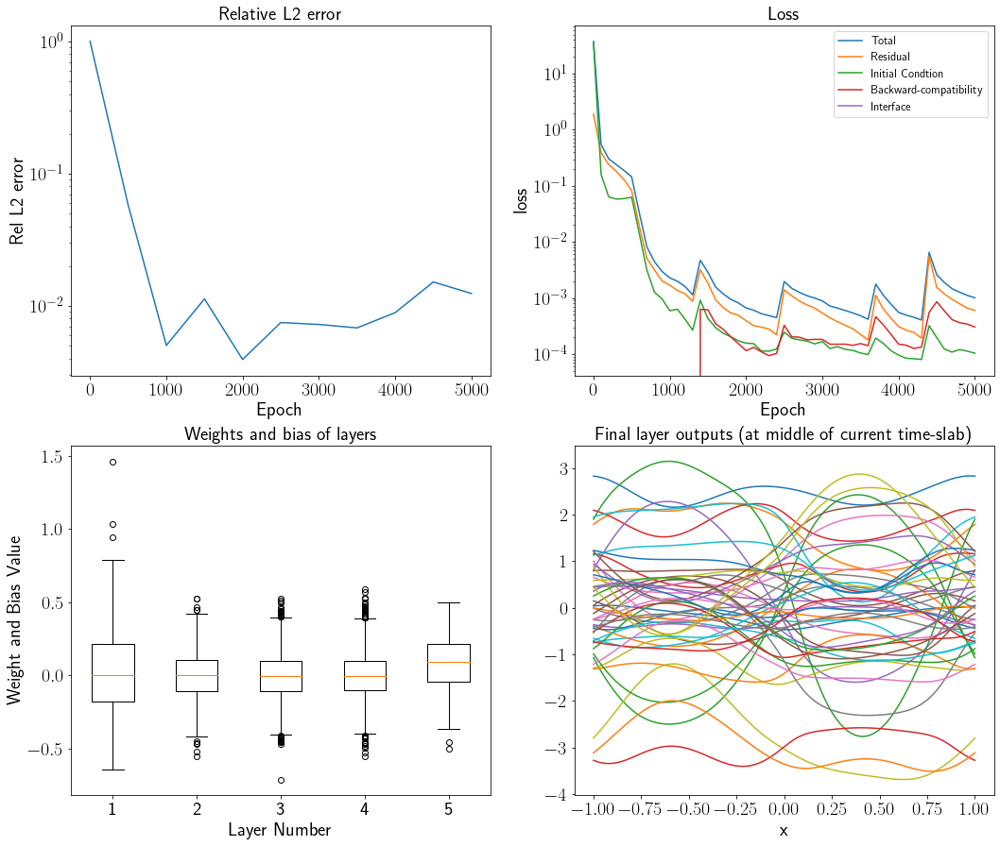

L2-error:  0.012389501834984341
Train L-BFGS:
epoch 100, loss: 0.000934898, delta loss: 4.89701e-07
epoch 200, loss: 0.000862731, delta loss: 9.27655e-07
epoch 300, loss: 0.000785655, delta loss: 8.35978e-07
epoch 400, loss: 0.000684789, delta loss: 8.60018e-07
epoch 500, loss: 0.000619063, delta loss: 8.02858e-07
Training time: 149.0677


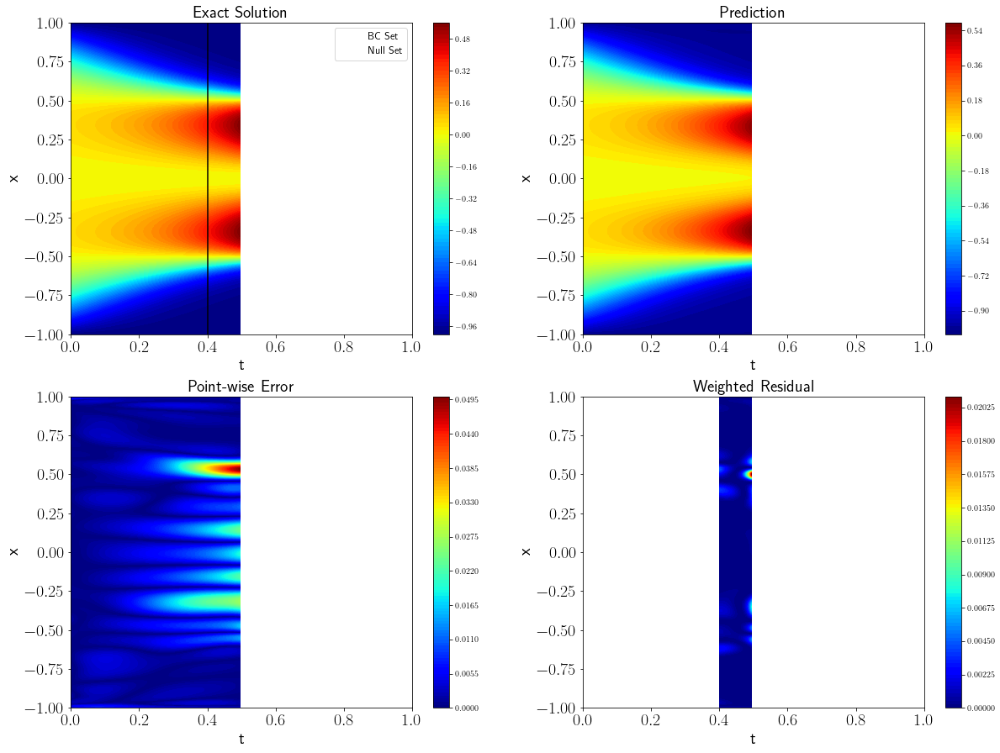

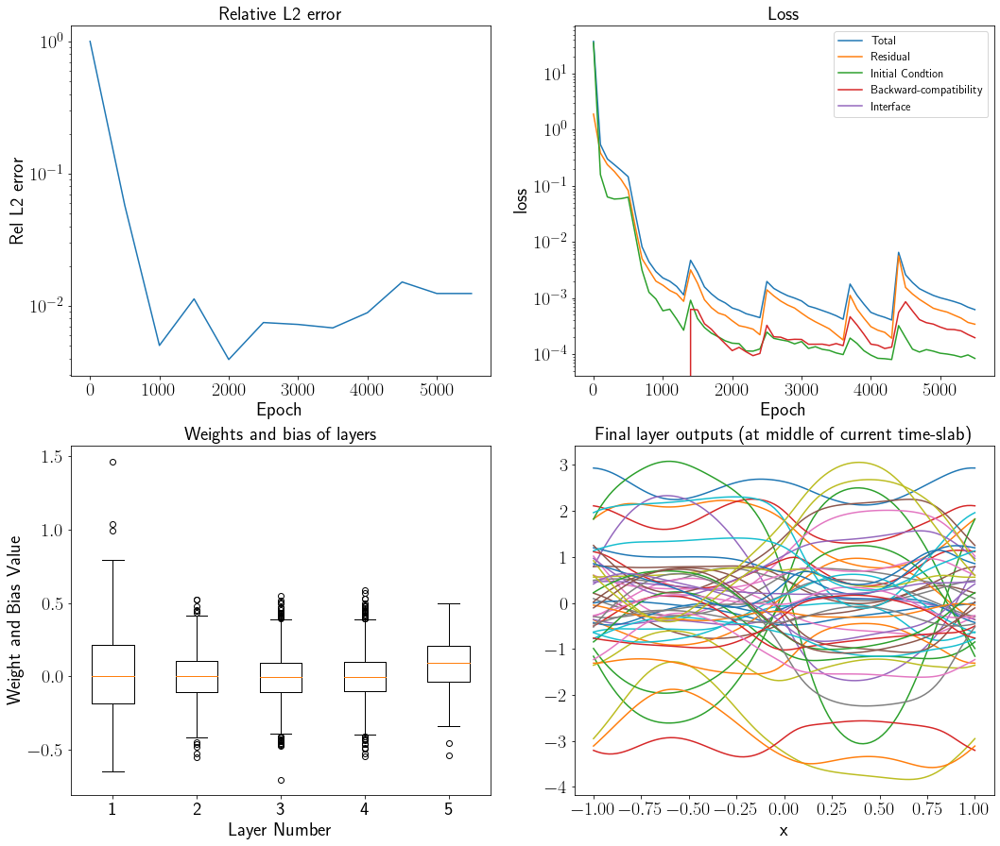

L2-error:  0.012385450008393759
Train L-BFGS:
epoch 100, loss: 0.000551958, delta loss: 3.34752e-07
epoch 200, loss: 0.000506958, delta loss: 3.7346e-07
epoch 300, loss: 0.000454687, delta loss: 3.27564e-07
epoch 400, loss: 0.00334108, delta loss: 1.78041e-05
epoch 500, loss: 0.00210796, delta loss: 1.10292e-05
Training time: 163.2322


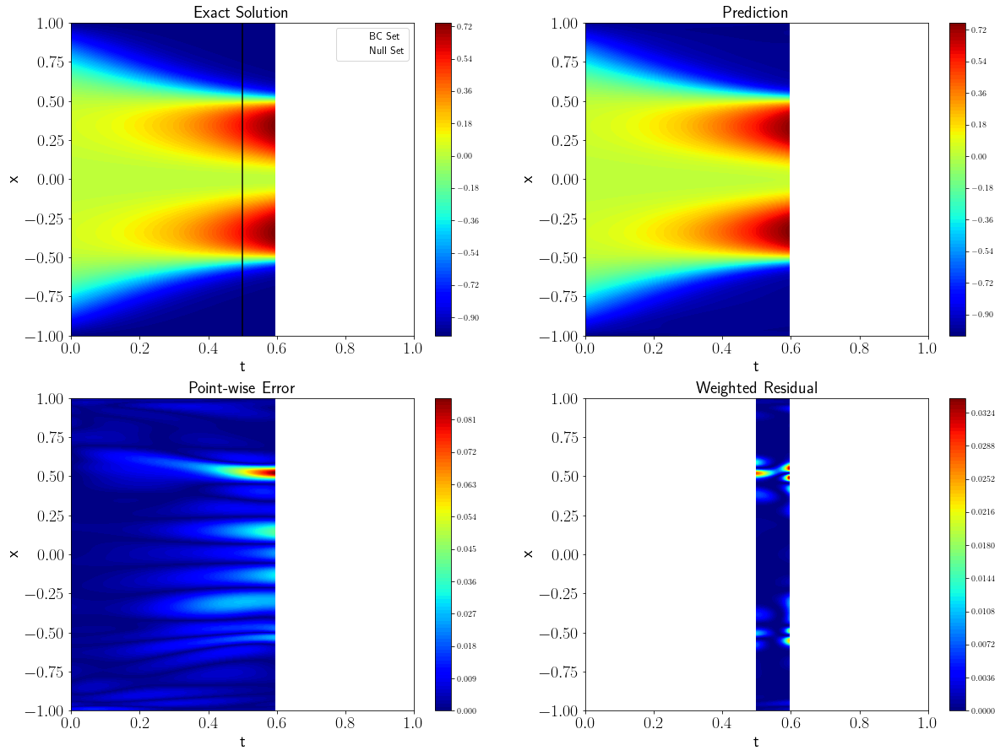

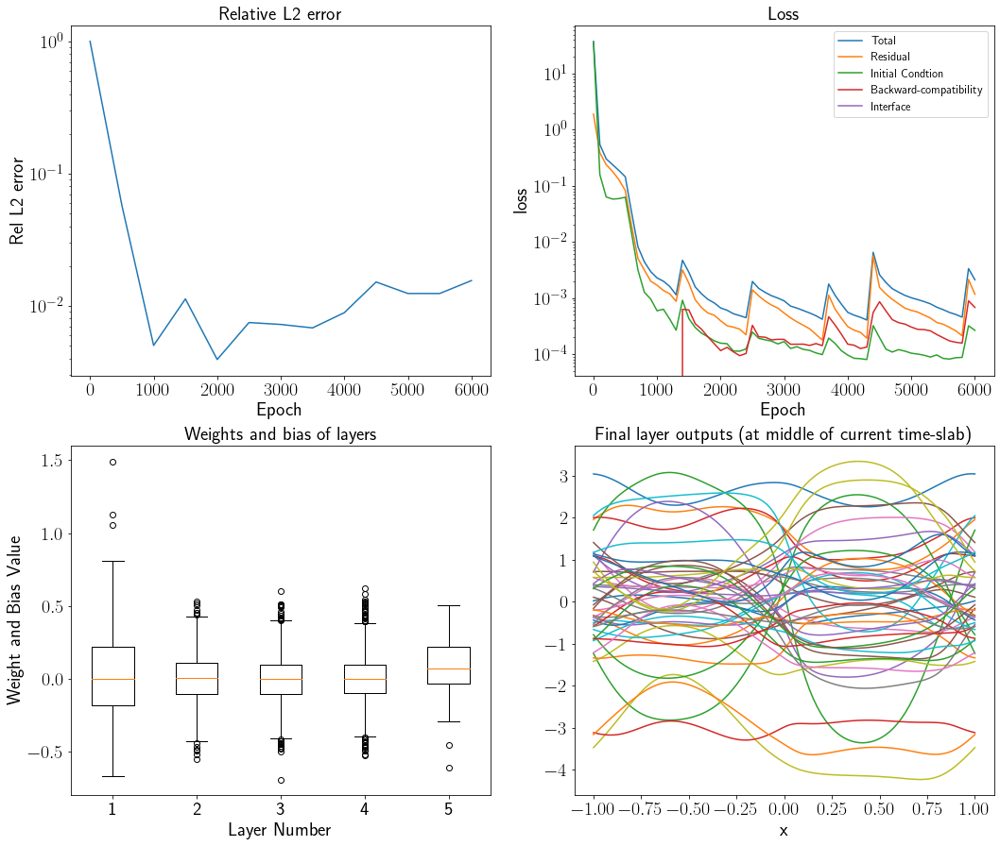

L2-error:  0.015509515834649127
Train L-BFGS:
epoch 100, loss: 0.00136758, delta loss: 4.69631e-06
epoch 200, loss: 0.00106692, delta loss: 1.87743e-06
epoch 300, loss: 0.000833308, delta loss: 2.07435e-06
epoch 400, loss: 0.000696014, delta loss: 1.28767e-06
epoch 500, loss: 0.000623438, delta loss: 4.4331e-07
Training time: 178.4363


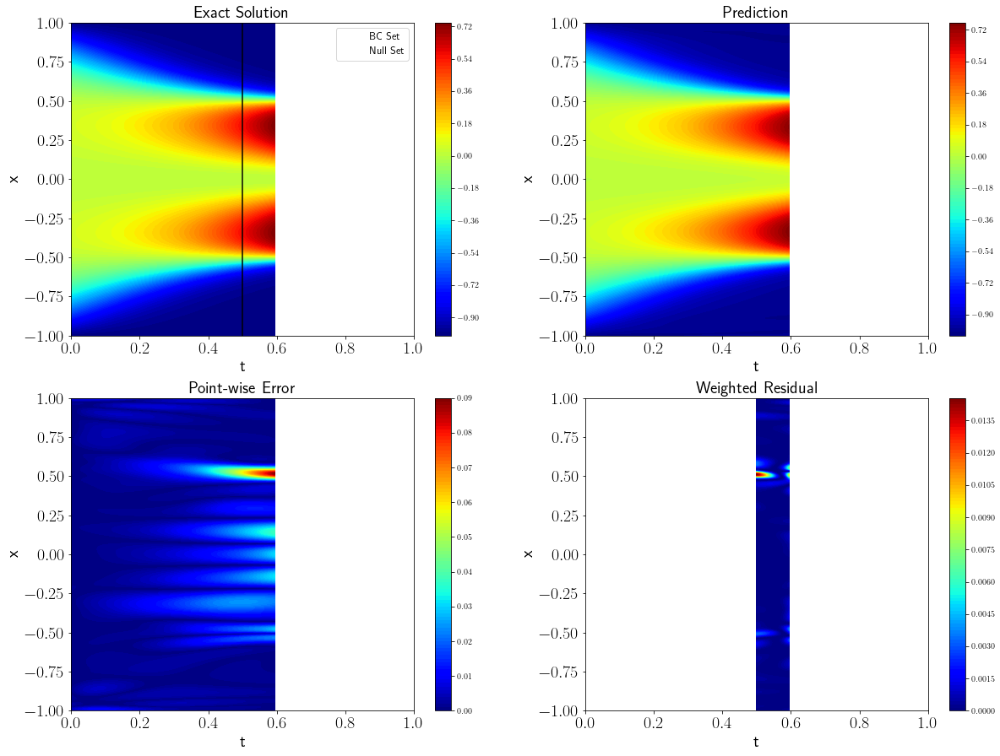

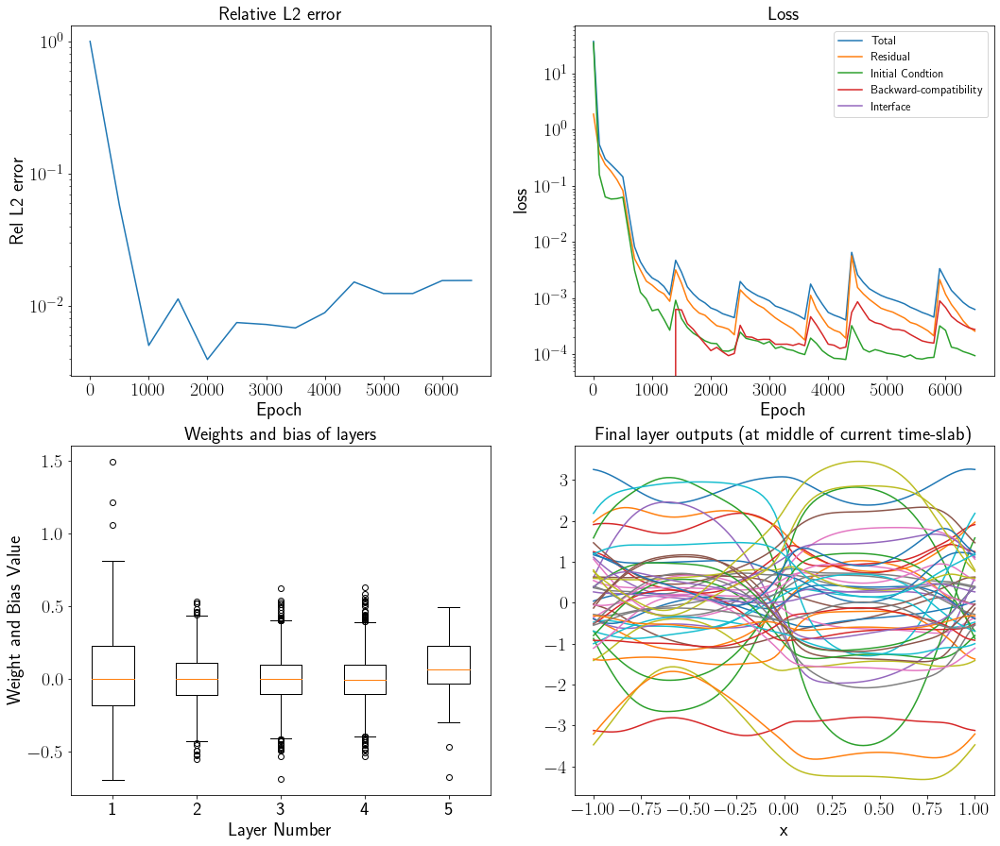

L2-error:  0.015540114832019903
Train L-BFGS:
epoch 100, loss: 0.00057692, delta loss: 3.19968e-07
epoch 200, loss: 0.000513741, delta loss: 1.00117e-06
epoch 300, loss: 0.000450331, delta loss: 2.21189e-07
epoch 400, loss: 0.000407348, delta loss: 3.75789e-07
epoch 500, loss: 0.000369202, delta loss: 8.94943e-08
Training time: 193.7003


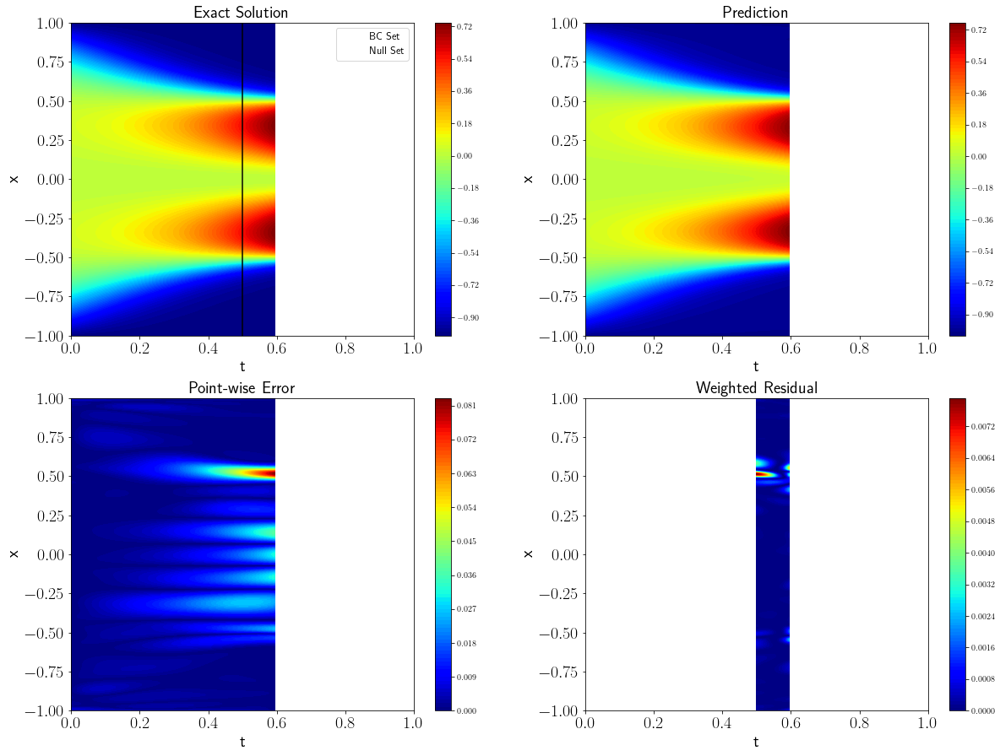

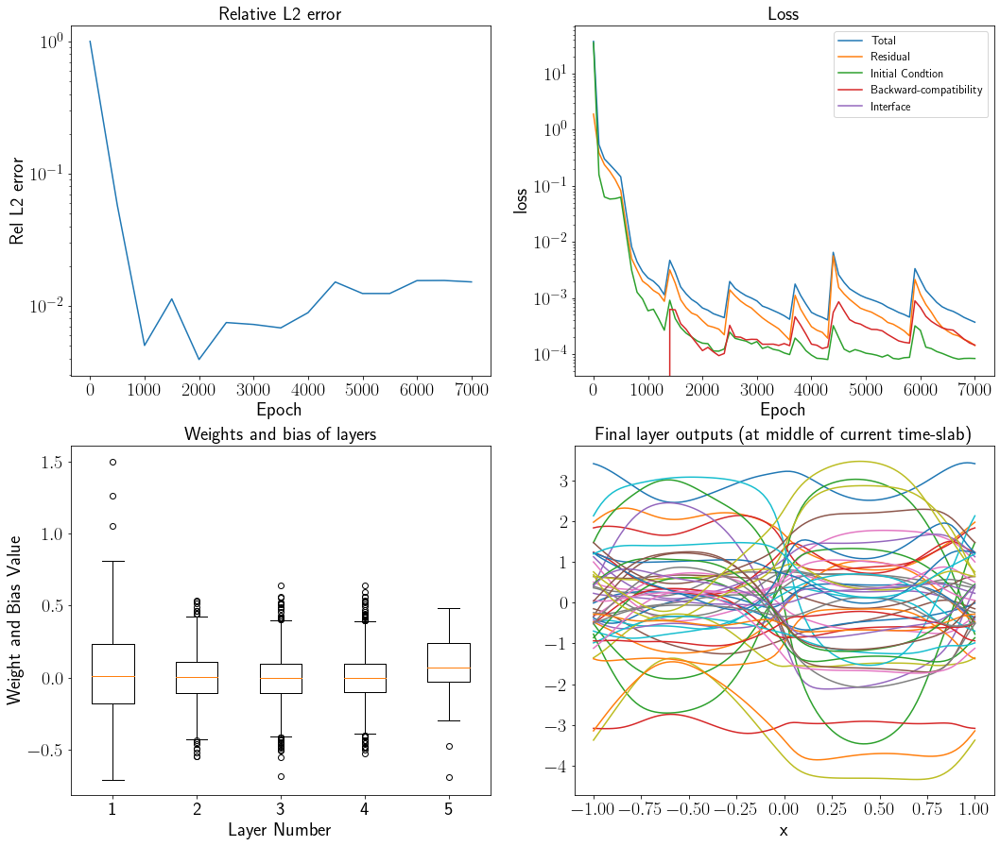

L2-error:  0.015157507061671249
Train L-BFGS:
epoch 100, loss: 0.000351954, delta loss: 1.90223e-07
epoch 200, loss: 0.000332047, delta loss: 1.32597e-07
epoch 300, loss: 0.000307567, delta loss: 2.27505e-07
epoch 400, loss: 0.00394991, delta loss: 0.000183628
epoch 500, loss: 0.00134591, delta loss: 1.12762e-05
Training time: 208.9754


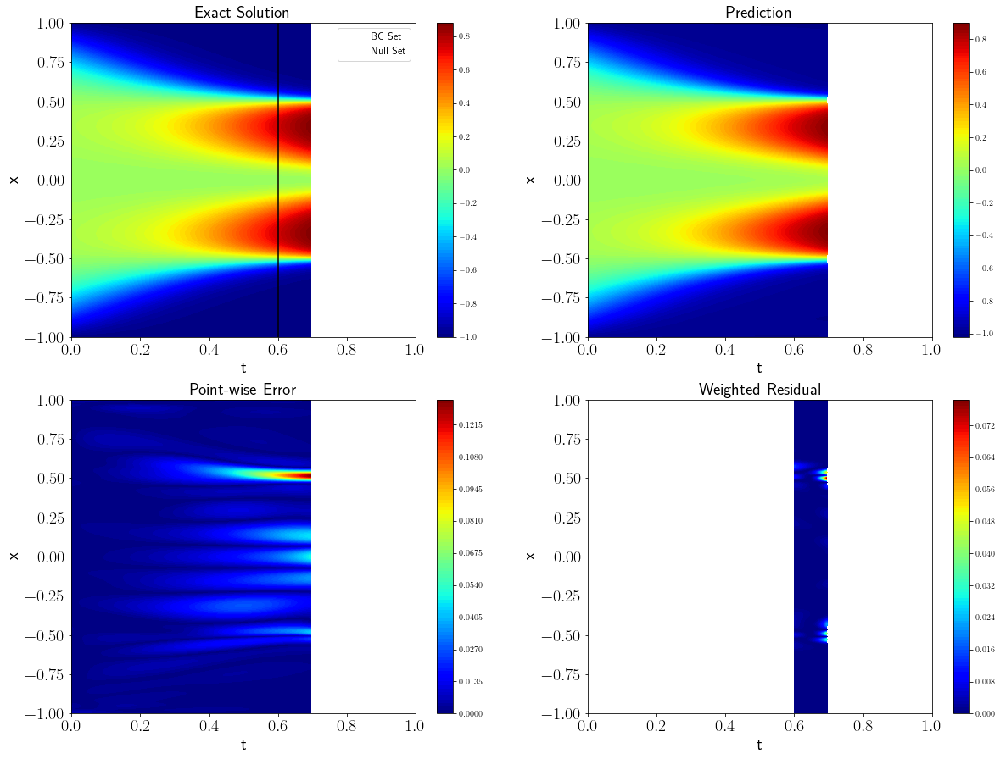

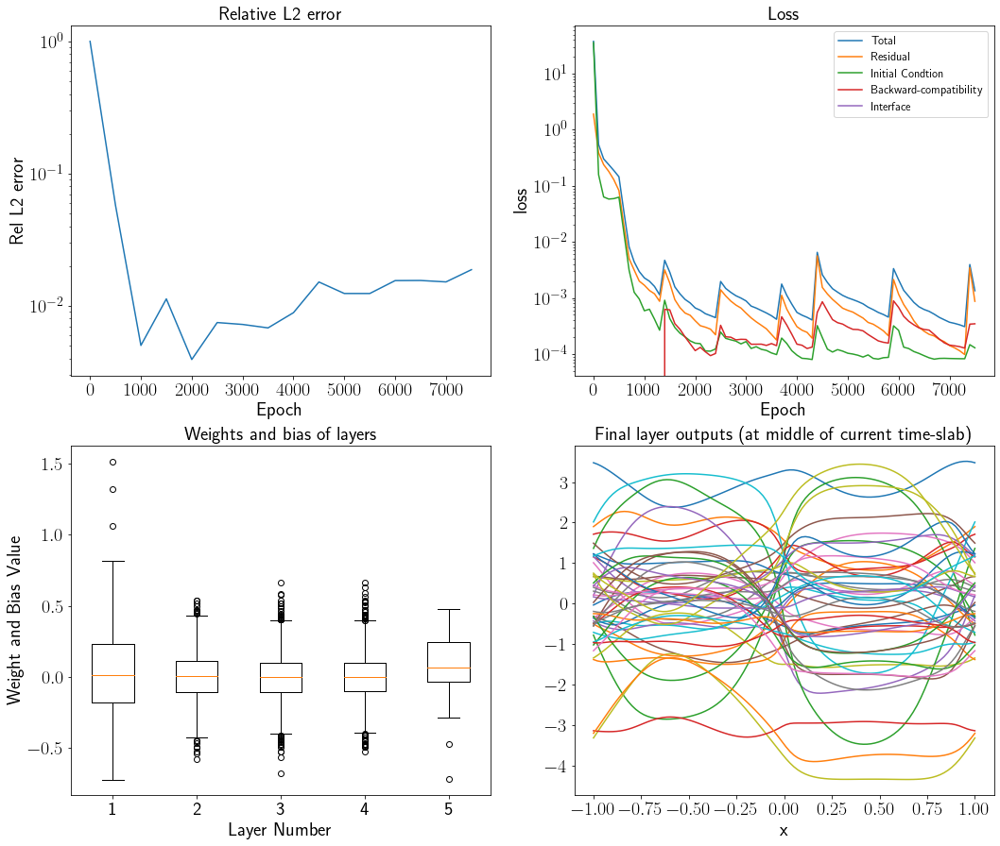

L2-error:  0.01875590723314859
Train L-BFGS:
epoch 100, loss: 0.000796657, delta loss: 2.63425e-06
epoch 200, loss: 0.00063495, delta loss: 1.39326e-06
epoch 300, loss: 0.00056029, delta loss: 6.96629e-07
epoch 400, loss: 0.000496597, delta loss: 4.80679e-07
epoch 500, loss: 0.000448564, delta loss: 8.68255e-07
Training time: 226.4788


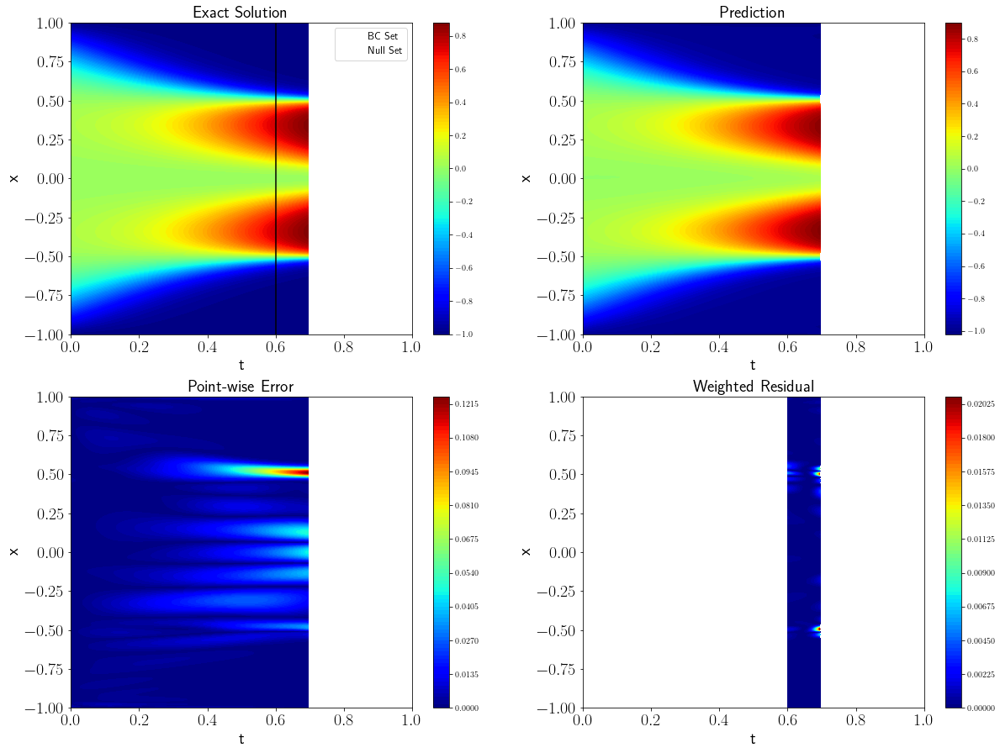

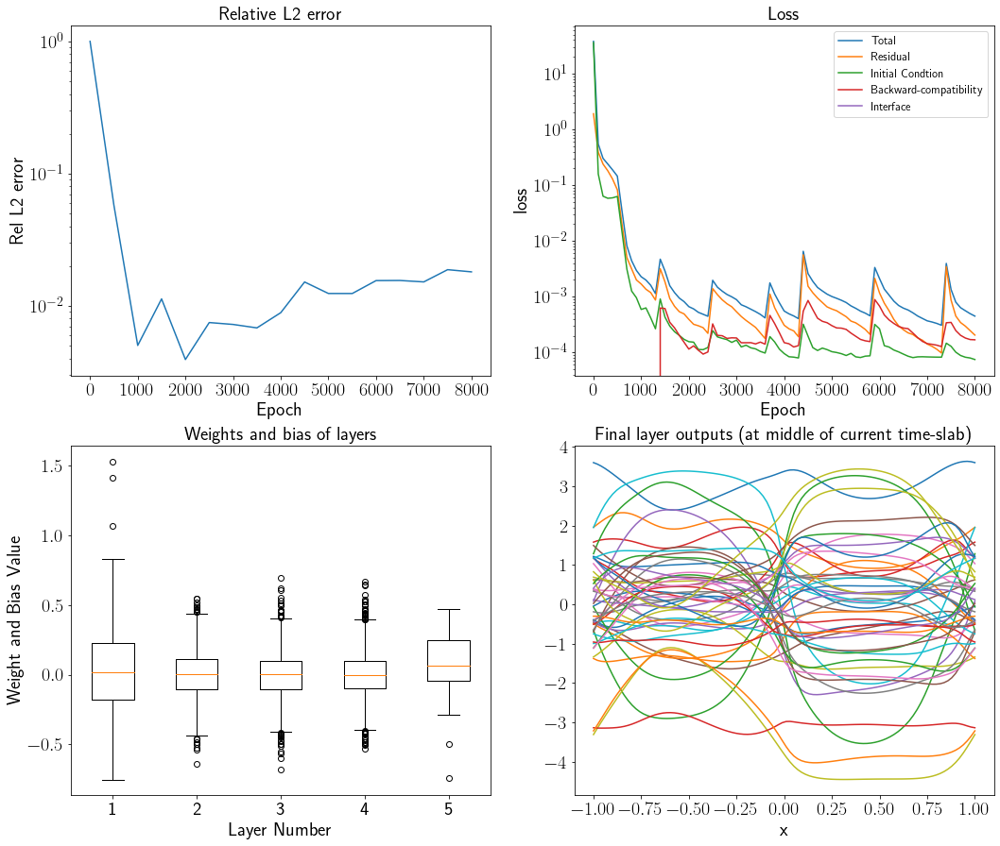

L2-error:  0.018057394472769377
Train L-BFGS:
epoch 100, loss: 0.000391495, delta loss: 5.12227e-07
epoch 200, loss: 0.000351388, delta loss: 3.4945e-07
epoch 300, loss: 0.000314194, delta loss: 5.50586e-07
epoch 400, loss: 0.000284196, delta loss: 2.35974e-07
epoch 500, loss: 0.000264967, delta loss: 2.06317e-07
Training time: 243.4144


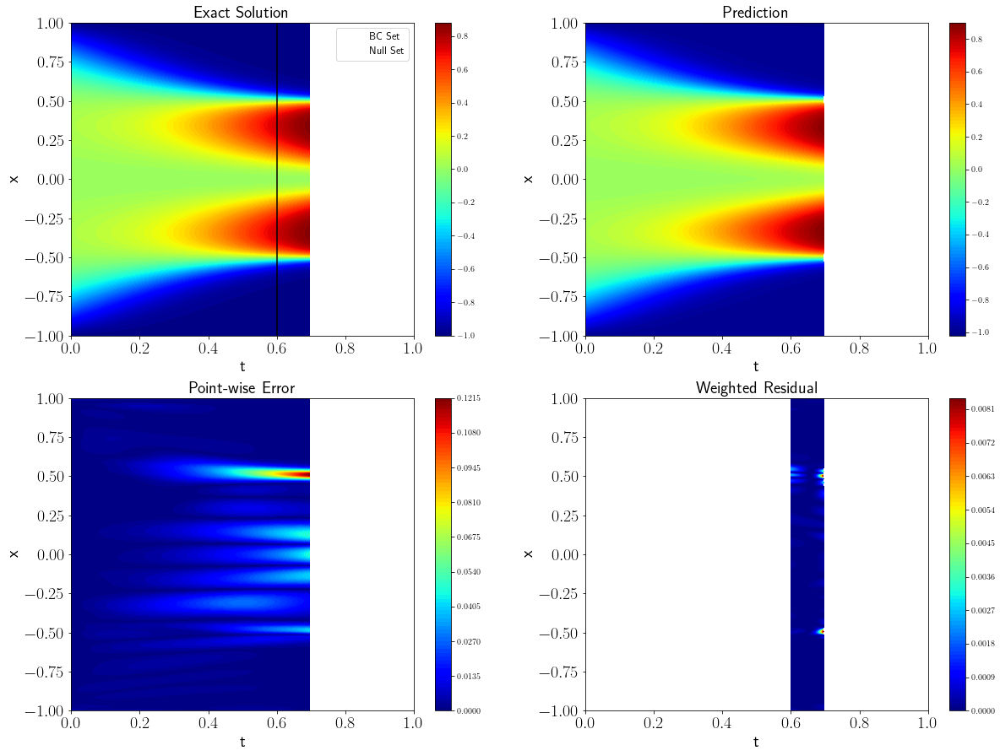

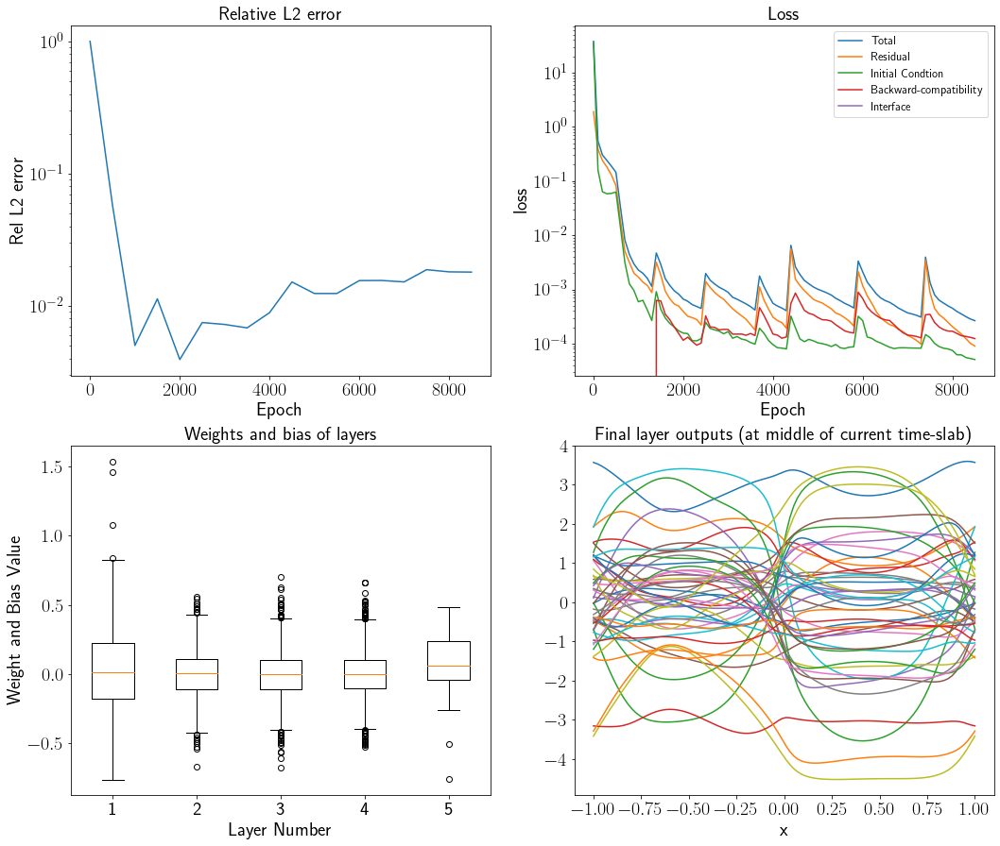

L2-error:  0.017982748188350824
Train L-BFGS:
epoch 100, loss: 0.000248833, delta loss: 1.39524e-07
epoch 200, loss: 0.000234121, delta loss: 2.30662e-07
epoch 300, loss: 0.00500899, delta loss: 0.000168556
epoch 400, loss: 0.00169689, delta loss: 9.81835e-06
epoch 500, loss: 0.00101612, delta loss: 2.56277e-06
Training time: 260.5259


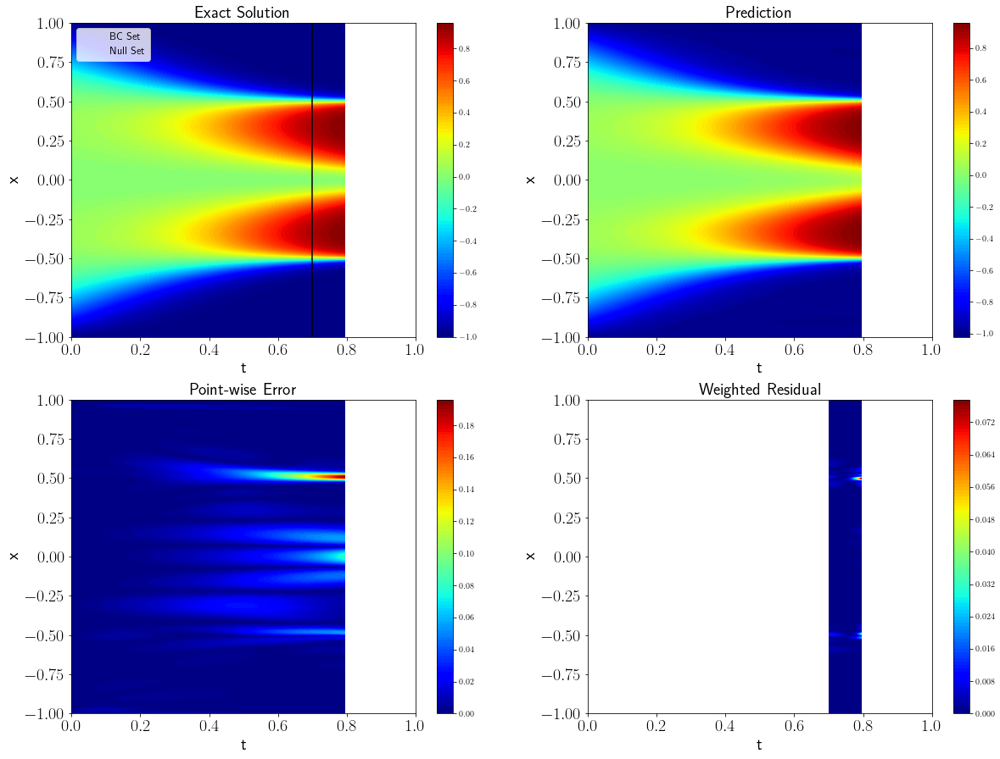

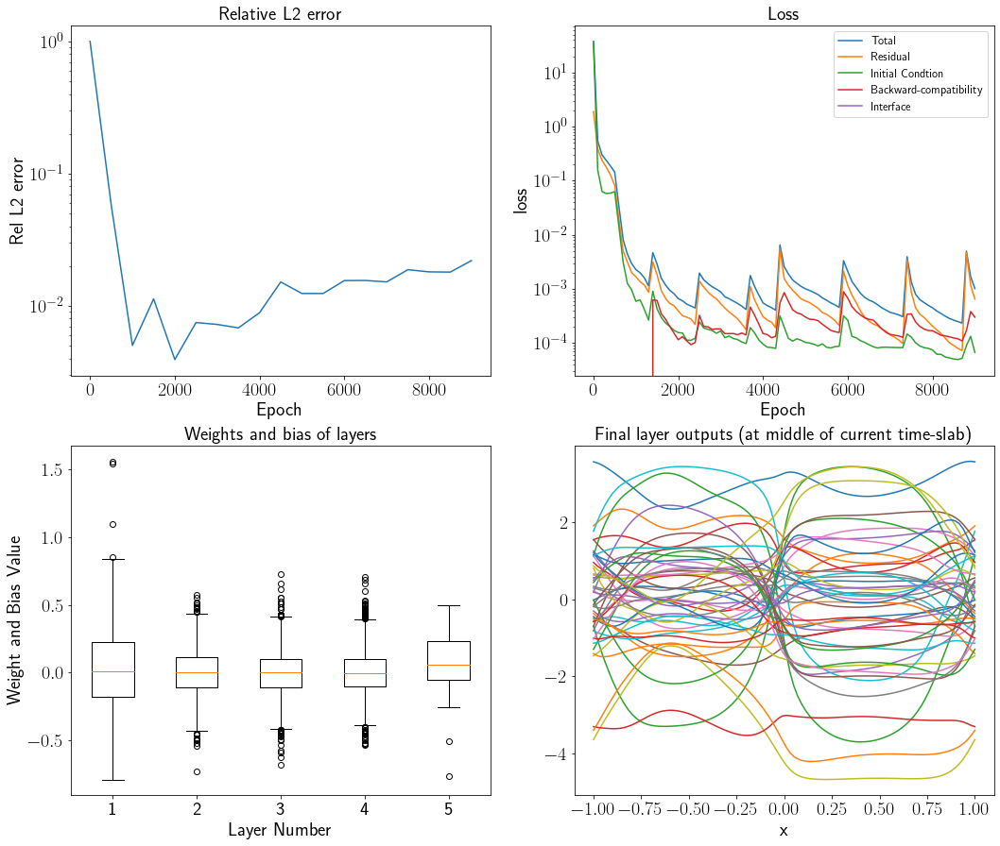

L2-error:  0.021968487819674965
Train L-BFGS:
epoch 100, loss: 0.000706321, delta loss: 2.18081e-06
epoch 200, loss: 0.000564255, delta loss: 7.90402e-07
epoch 300, loss: 0.00046286, delta loss: 1.38517e-06
epoch 400, loss: 0.000398579, delta loss: 5.11645e-07
epoch 500, loss: 0.000355247, delta loss: 3.45113e-07
Training time: 278.9580


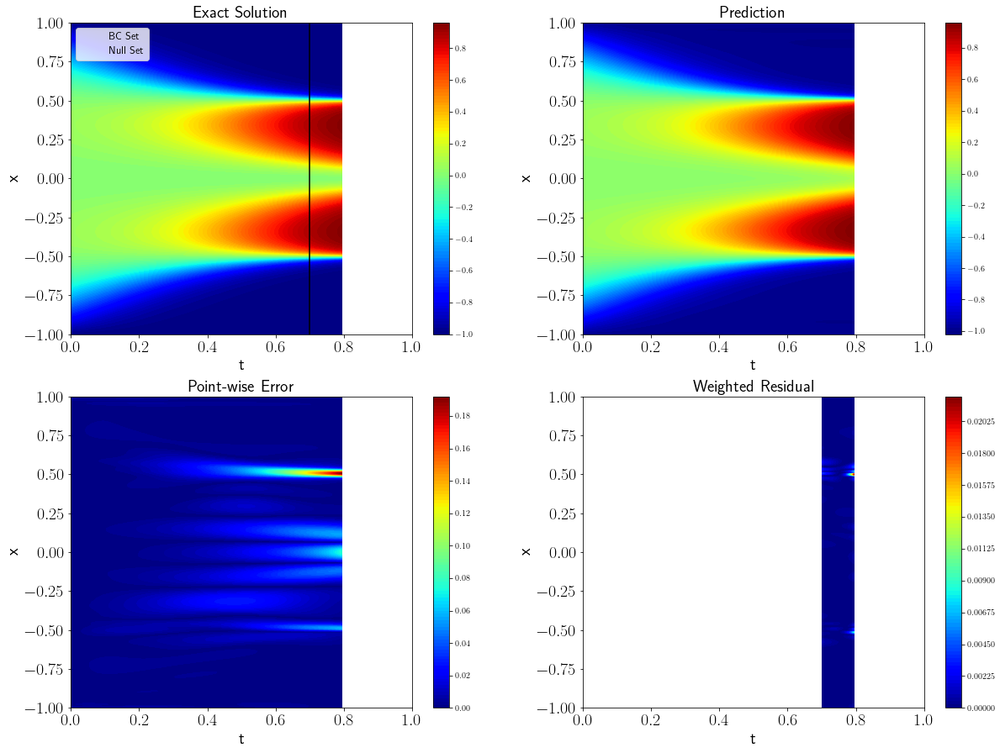

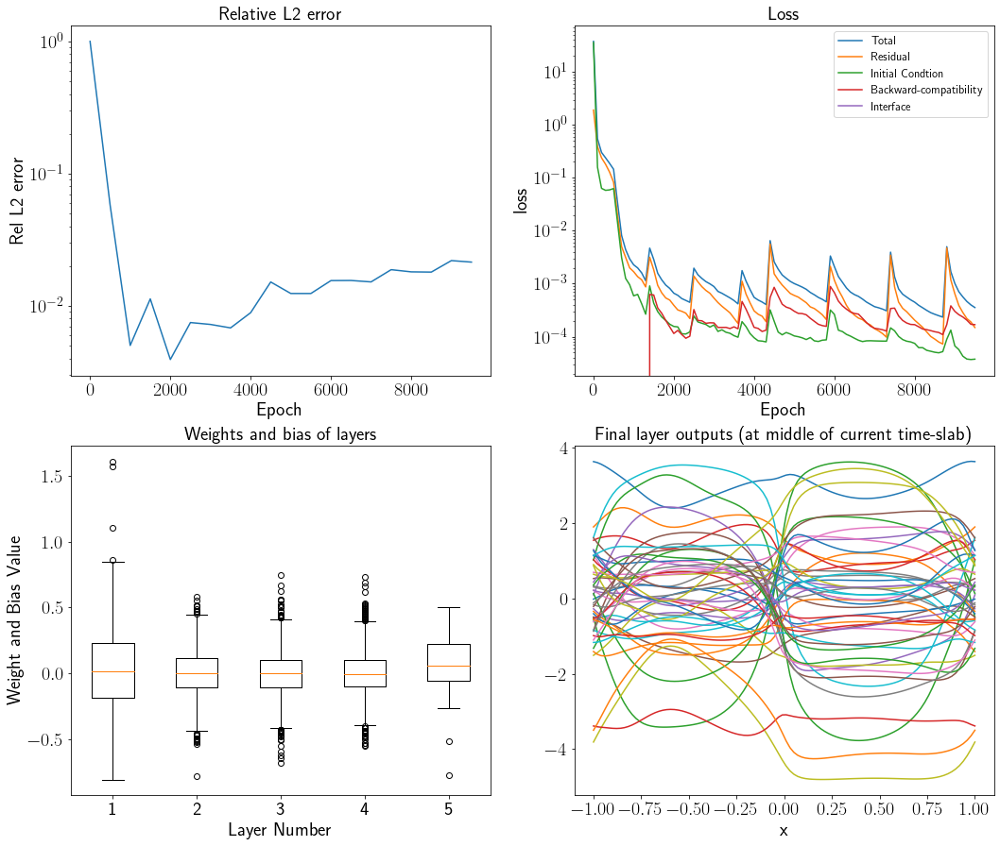

L2-error:  0.021401550381431295
Train L-BFGS:
epoch 100, loss: 0.000326726, delta loss: 2.83151e-07
epoch 200, loss: 0.000304118, delta loss: 1.10507e-07
epoch 300, loss: 0.000288701, delta loss: 2.00671e-07
epoch 400, loss: 0.000269011, delta loss: 2.75002e-07
epoch 500, loss: 0.000249016, delta loss: 2.4063e-07
Training time: 296.7264


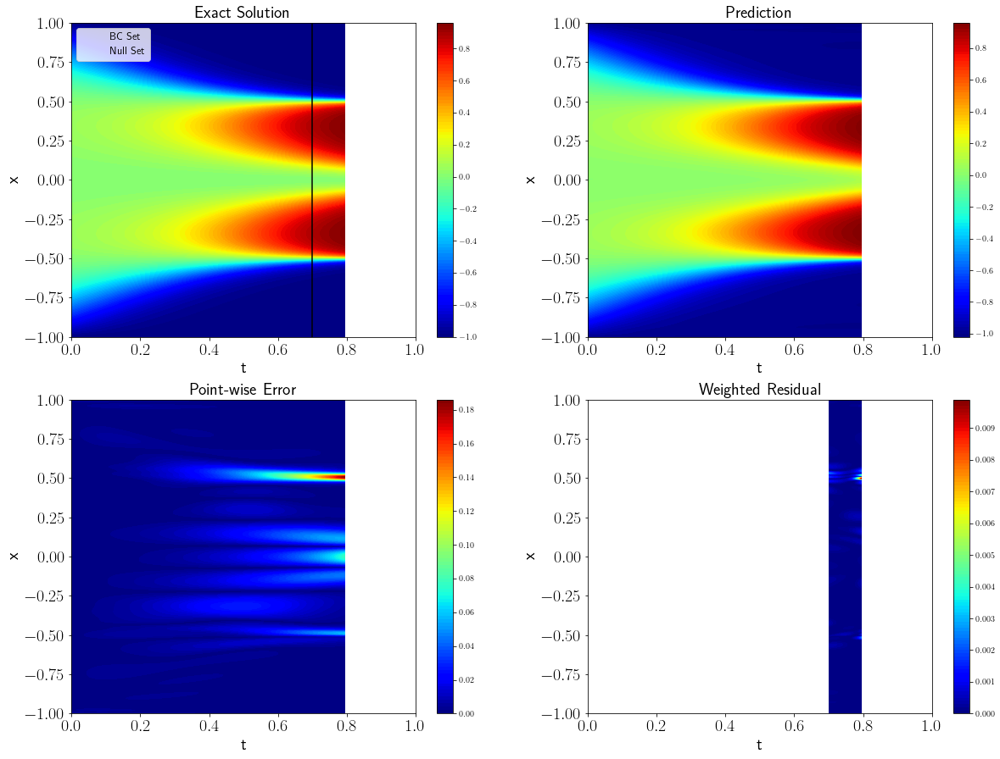

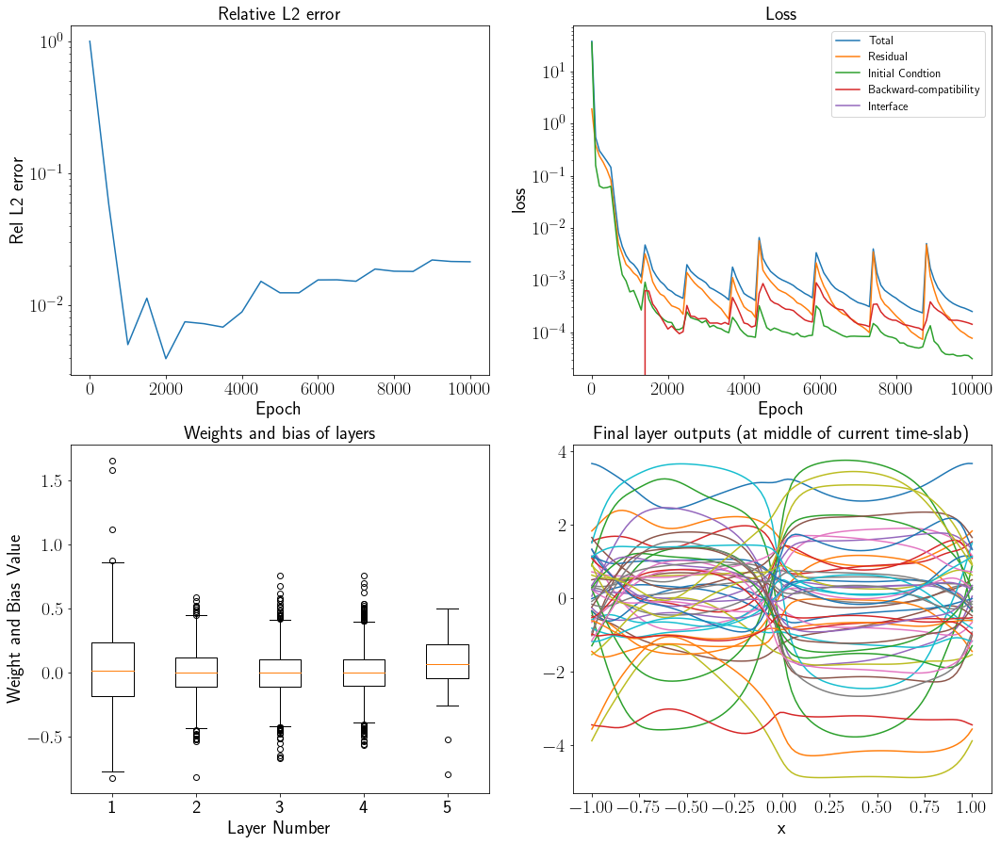

L2-error:  0.021290103673616223
Train L-BFGS:
epoch 100, loss: 0.000228269, delta loss: 2.28407e-07
epoch 200, loss: 0.000215843, delta loss: 1.82496e-07
epoch 300, loss: 0.000201503, delta loss: 1.21901e-07
epoch 400, loss: 0.00213755, delta loss: 7.93743e-06
epoch 500, loss: 0.00109372, delta loss: 6.00202e-06
Training time: 314.6476


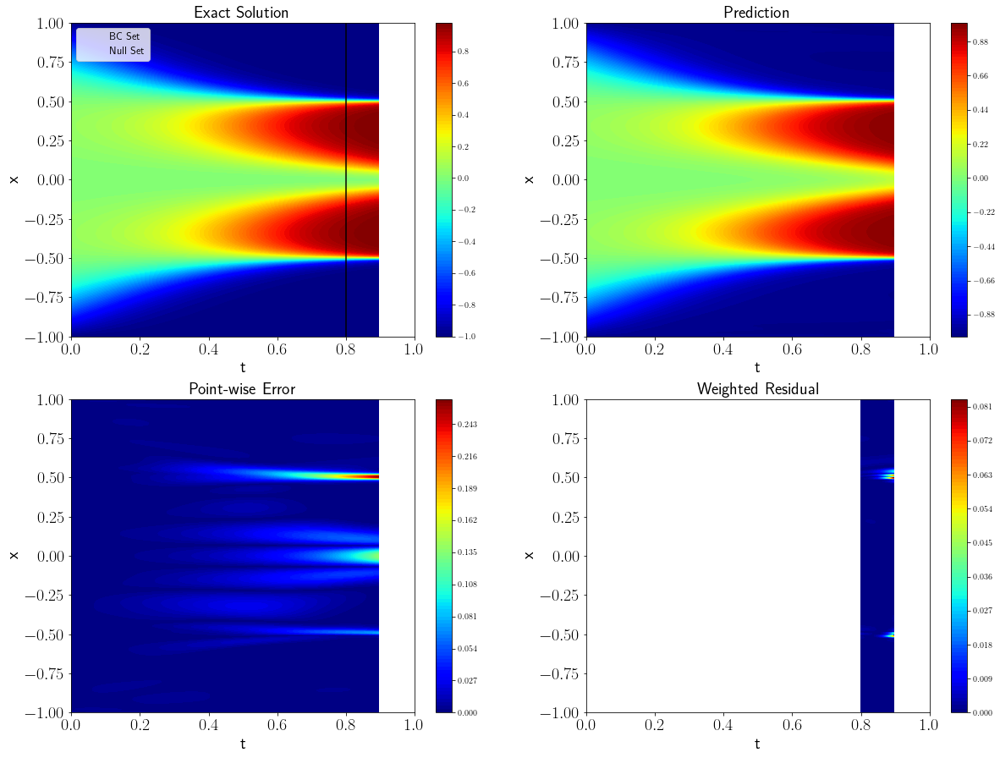

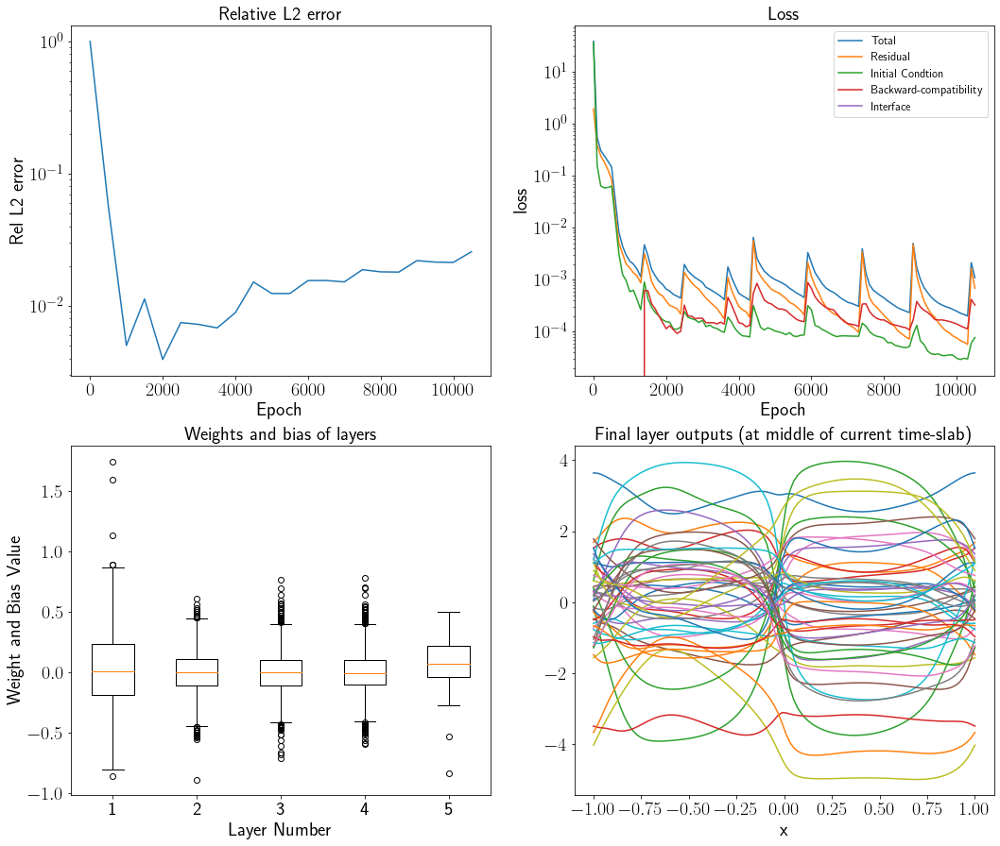

L2-error:  0.02564267815928431
Train L-BFGS:
epoch 100, loss: 0.000673638, delta loss: 2.91894e-06
epoch 200, loss: 0.000505964, delta loss: 1.85822e-06
epoch 300, loss: 0.000387112, delta loss: 6.42933e-07
epoch 400, loss: 0.000327662, delta loss: 8.18225e-07
epoch 500, loss: 0.00027705, delta loss: 4.36092e-07
Training time: 333.1452


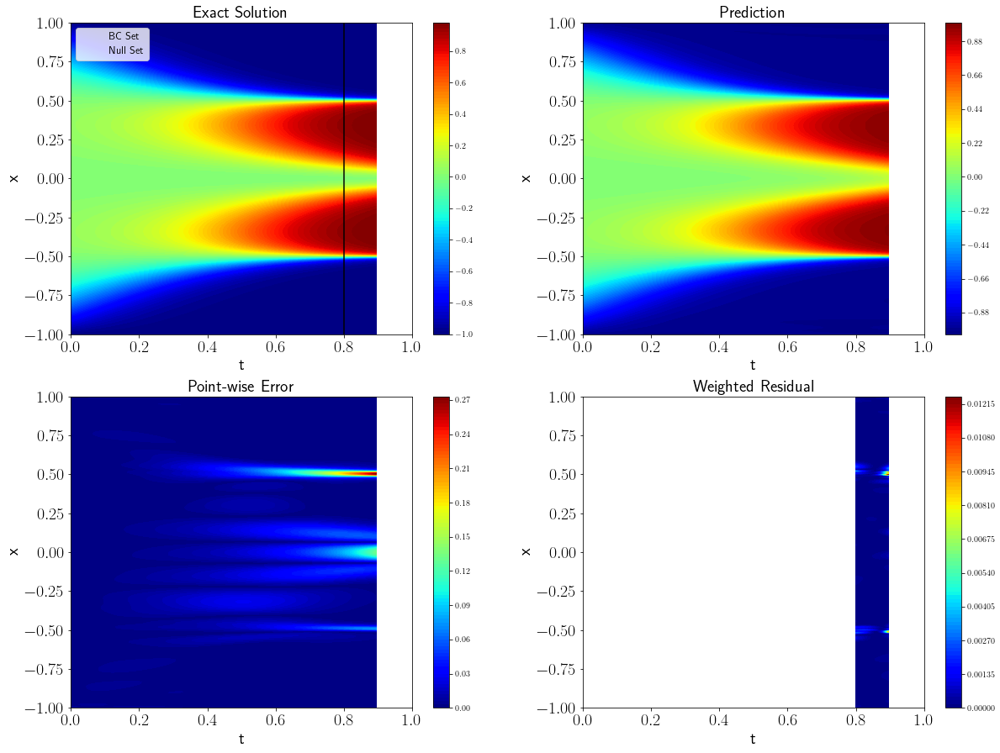

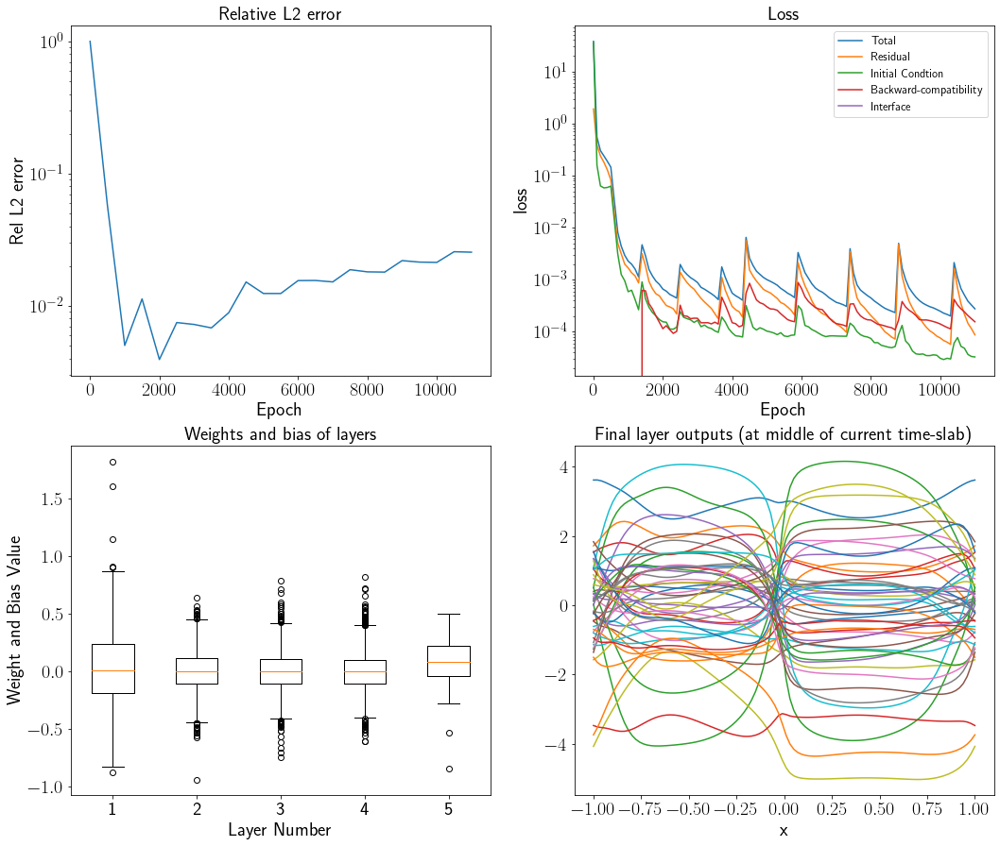

L2-error:  0.025435254057263545
Train L-BFGS:
epoch 100, loss: 0.000254641, delta loss: 2.16358e-07
epoch 200, loss: 0.000240294, delta loss: 1.79949e-07
epoch 300, loss: 0.00022081, delta loss: 2.21335e-07
epoch 400, loss: 0.00336631, delta loss: 9.22708e-07
epoch 500, loss: 0.00127097, delta loss: 6.77363e-06
Training time: 352.2951


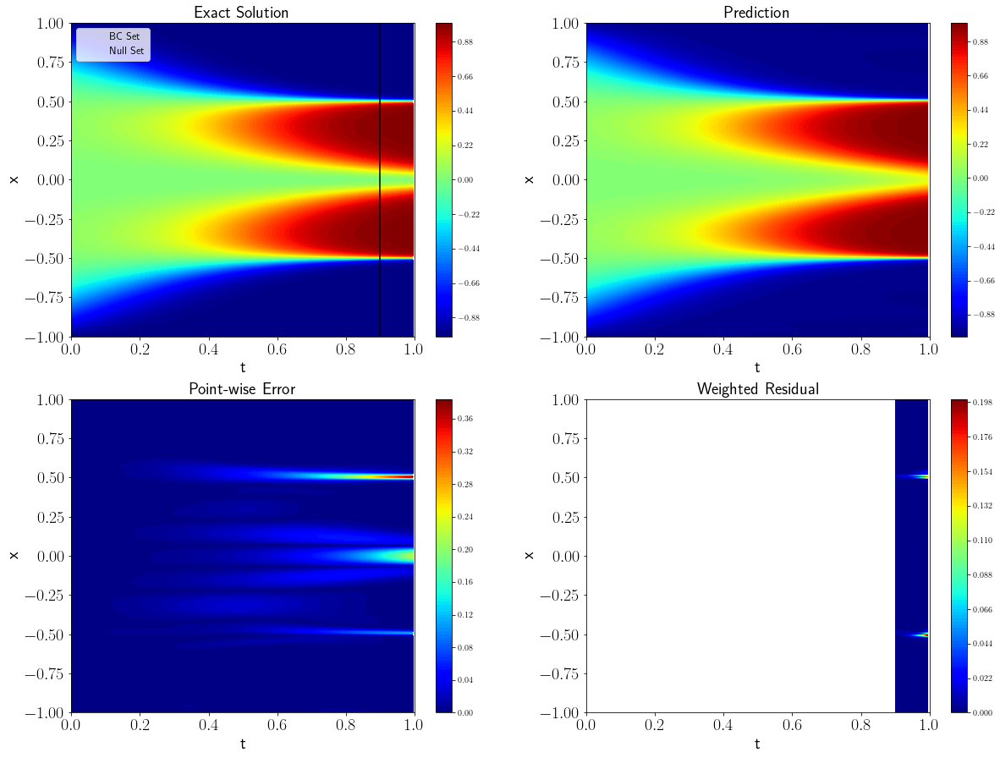

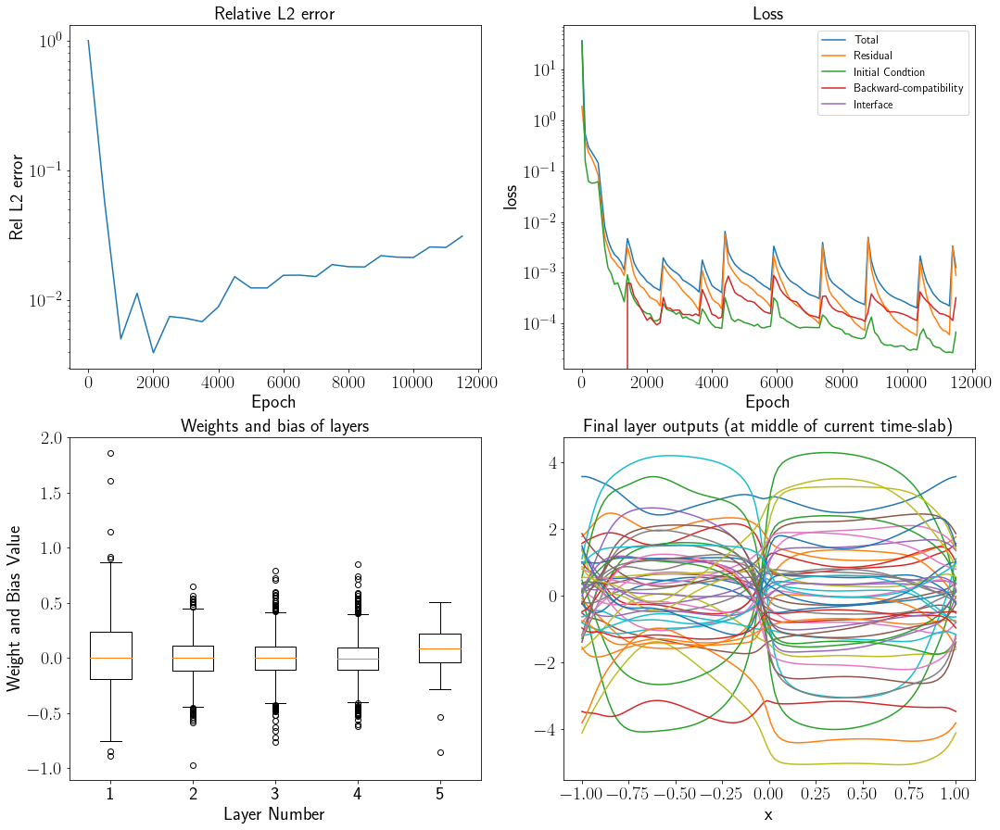

L2-error:  0.031106659069888357
Train L-BFGS:
epoch 100, loss: 0.000646547, delta loss: 2.90037e-06
epoch 200, loss: 0.000465431, delta loss: 1.25641e-06
epoch 300, loss: 0.000397062, delta loss: 3.86935e-07
epoch 400, loss: 0.00034735, delta loss: 6.42205e-07
epoch 500, loss: 0.000298807, delta loss: 5.31465e-07
Training time: 371.9168


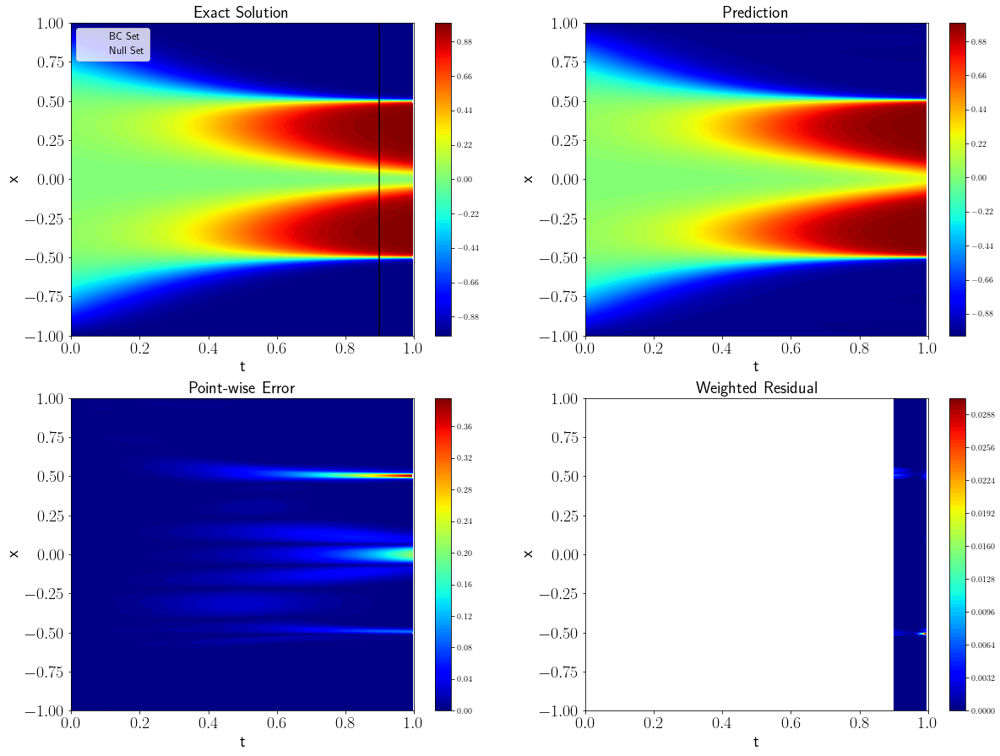

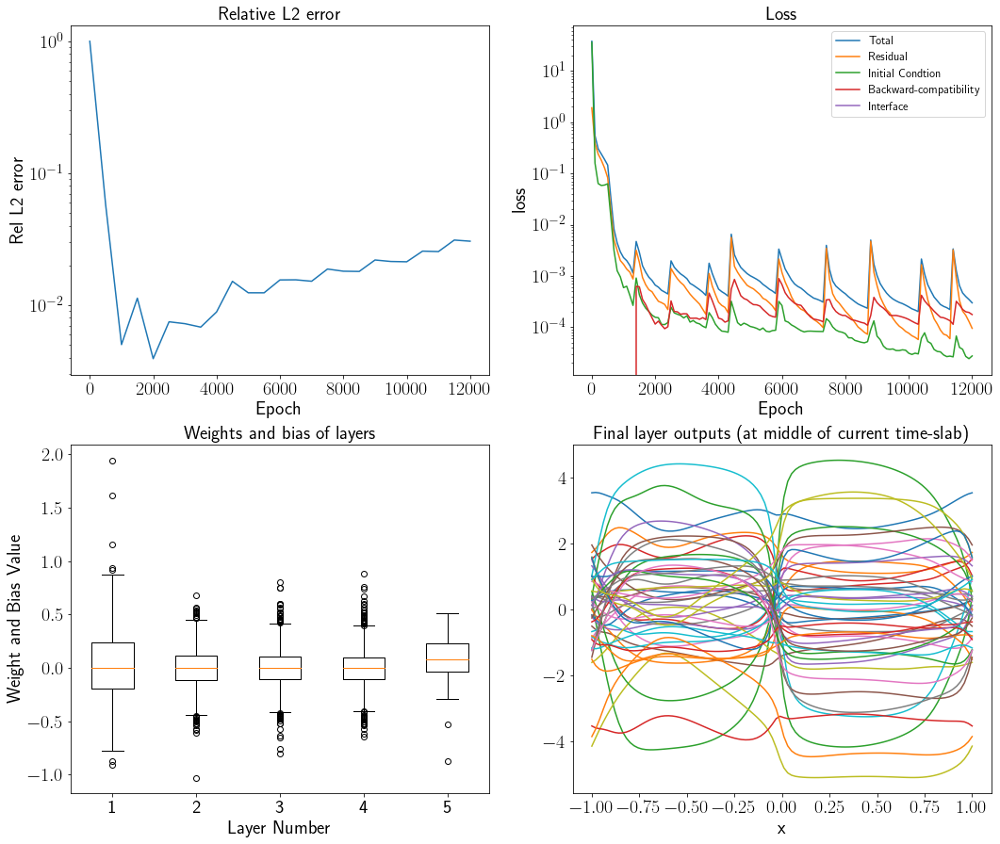

L2-error:  0.03048681853004731
Train L-BFGS:
epoch 100, loss: 0.000265776, delta loss: 2.87197e-07
epoch 200, loss: 0.00023975, delta loss: 2.01762e-07
epoch 300, loss: 0.000216945, delta loss: 3.06245e-07
epoch 400, loss: 0.000202991, delta loss: 6.61239e-08
epoch 500, loss: 0.000192783, delta loss: 1.45708e-07
Training time: 391.4675


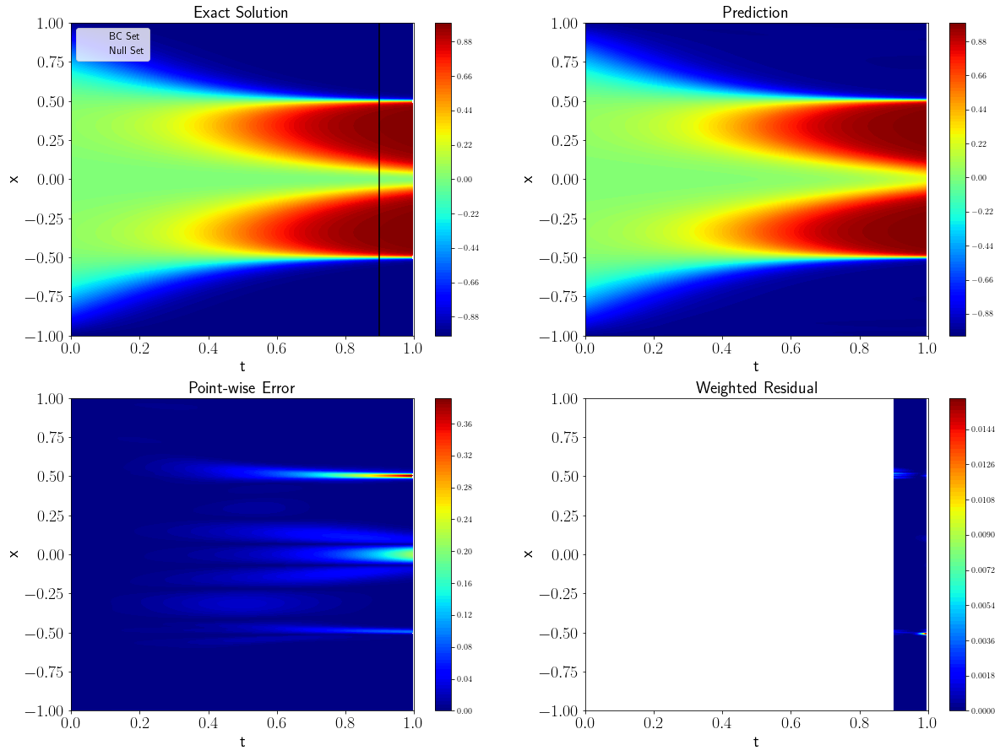

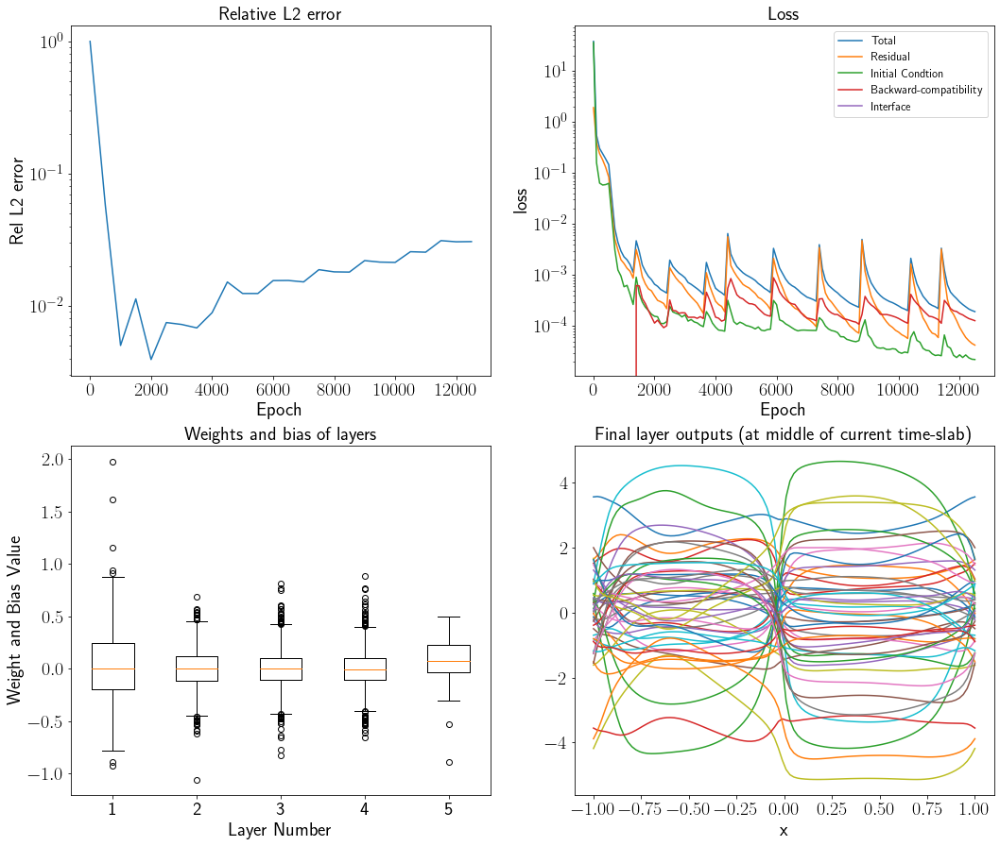

L2-error:  0.030585741335716694
Train L-BFGS:
epoch 100, loss: 0.000181875, delta loss: 7.04458e-08
epoch 200, loss: nan, delta loss: nan
epoch 300, loss: nan, delta loss: nan
epoch 400, loss: nan, delta loss: nan
epoch 500, loss: nan, delta loss: nan
Training time: 408.0382


RuntimeError: Error in qhull Delaunay triangulation calculation: input inconsistency (exitcode=1); use python verbose option (-v) to see original qhull error.

In [12]:
adam_loops = 1
lbfgs_loops = 100
model = training_loop(userPar, dataPar, model, adam_loops, lbfgs_loops)

### Step 3.4: Make animation if figures were saved

In [ ]:
if userPar['save_fig'] == 1:
    make_gif(userPar['model_name'])